* LLM used: Meta Llama3 8b Instruct LLM model
* Embedding used: HuggingFace BGE Large EN Embedding model
* Dataset used: TheProcessorFood (HuggingFace)

In [1]:
%%writefile requirements.txt
langchain==0.1.14
pypdf==4.1.0
faiss-cpu==1.8.0
boto3==1.34.58
sqlalchemy==2.0.29

Overwriting requirements.txt


In [2]:
import sqlalchemy
print(sqlalchemy.__version__)

2.0.30


In [3]:
pip install nvidia-ml-py3==7.352.0

  Using cached nvidia_ml_py3-7.352.0-py3-none-any.whl
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autogluon-multimodal 1.1.1 requires omegaconf<2.3.0,>=2.1.1, but you have omegaconf 2.3.0 which is incompatible.
autogluon-multimodal 1.1.1 requires scikit-learn<1.4.1,>=1.3.0, but you have scikit-learn 1.4.2 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install sqlparse==0.5.0

  Using cached sqlparse-0.5.0-py3-none-any.whl.metadata (3.9 kB)
Using cached sqlparse-0.5.0-py3-none-any.whl (43 kB)
  Attempting uninstall: sqlparse
    Found existing installation: sqlparse 0.5.1
    Uninstalling sqlparse-0.5.1:
      Successfully uninstalled sqlparse-0.5.1
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install scikit-learn==1.3.0

  Using cached scikit_learn-1.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
Using cached scikit_learn-1.3.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (10.9 MB)
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.2
    Uninstalling scikit-learn-1.4.2:
      Successfully uninstalled scikit-learn-1.4.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autogluon-multimodal 1.1.1 requires omegaconf<2.3.0,>=2.1.1, but you have omegaconf 2.3.0 which is incompatible.
autogluon-timeseries 1.1.1 requires gluonts==0.15.1, but you have gluonts 0.14.3 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install omegaconf==2.2.3

  Using cached omegaconf-2.2.3-py3-none-any.whl.metadata (3.9 kB)
Using cached omegaconf-2.2.3-py3-none-any.whl (79 kB)
  Attempting uninstall: omegaconf
    Found existing installation: omegaconf 2.3.0
    Uninstalling omegaconf-2.3.0:
      Successfully uninstalled omegaconf-2.3.0
Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install gluonts==0.15.1

  Using cached gluonts-0.15.1-py3-none-any.whl.metadata (9.9 kB)
Using cached gluonts-0.15.1-py3-none-any.whl (1.5 MB)
  Attempting uninstall: gluonts
    Found existing installation: gluonts 0.14.3
    Uninstalling gluonts-0.14.3:
      Successfully uninstalled gluonts-0.14.3
Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install langchain==0.1.14

  Using cached langchain-0.1.14-py3-none-any.whl.metadata (13 kB)
  Using cached langchain_community-0.0.38-py3-none-any.whl.metadata (8.7 kB)
  Using cached langchain_core-0.1.53-py3-none-any.whl.metadata (5.9 kB)
  Using cached langchain_text_splitters-0.0.2-py3-none-any.whl.metadata (2.2 kB)
  Using cached packaging-23.2-py3-none-any.whl.metadata (3.2 kB)
Using cached langchain-0.1.14-py3-none-any.whl (812 kB)
Using cached langchain_community-0.0.38-py3-none-any.whl (2.0 MB)
Using cached langchain_core-0.1.53-py3-none-any.whl (303 kB)
Using cached langchain_text_splitters-0.0.2-py3-none-any.whl (23 kB)
Using cached packaging-23.2-py3-none-any.whl (53 kB)
  Attempting uninstall: packaging
    Found existing installation: packaging 24.1
    Uninstalling packaging-24.1:
      Successfully uninstalled packaging-24.1
  Attempting uninstall: langchain-core
    Found existing installation: langchain-core 0.2.33
    Uninstalling langchain-core-0.2.33:
      Successfully uninstalled langchai

In [9]:
pip install --upgrade langchain langchain-core

  Using cached langchain-0.3.7-py3-none-any.whl.metadata (7.1 kB)
  Using cached langchain_core-0.3.15-py3-none-any.whl.metadata (6.3 kB)
  Using cached langchain_text_splitters-0.3.2-py3-none-any.whl.metadata (2.3 kB)
  Using cached pydantic-2.9.2-py3-none-any.whl.metadata (149 kB)
  Using cached langsmith-0.1.142-py3-none-any.whl.metadata (13 kB)
  Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl.metadata (14 kB)
  Using cached pydantic_core-2.23.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.6 kB)
Using cached langchain-0.3.7-py3-none-any.whl (1.0 MB)
Using cached langchain_core-0.3.15-py3-none-any.whl (408 kB)
Using cached langchain_text_splitters-0.3.2-py3-none-any.whl (25 kB)
Using cached langsmith-0.1.142-py3-none-any.whl (306 kB)
Using cached pydantic-2.9.2-py3-none-any.whl (434 kB)
Using cached pydantic_core-2.23.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
Using cached requests_toolbelt-1.0.0-py2.py3-none-any.whl (54

In [10]:
pip install boto3==1.34.58

  Using cached boto3-1.34.58-py3-none-any.whl.metadata (6.6 kB)
Using cached boto3-1.34.58-py3-none-any.whl (139 kB)
  Attempting uninstall: boto3
    Found existing installation: boto3 1.34.131
    Uninstalling boto3-1.34.131:
      Successfully uninstalled boto3-1.34.131
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
langchain-aws 0.1.16 requires boto3<1.35.0,>=1.34.131, but you have boto3 1.34.58 which is incompatible.
langchain-aws 0.1.16 requires langchain-core<0.3,>=0.2.29, but you have langchain-core 0.3.15 which is incompatible.
sagemaker 2.227.0 requires boto3<2.0,>=1.34.142, but you have boto3 1.34.58 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [11]:
!pip install -U -r requirements.txt

  Using cached langchain-0.1.14-py3-none-any.whl.metadata (13 kB)
  Using cached pypdf-4.1.0-py3-none-any.whl.metadata (7.4 kB)
  Using cached faiss_cpu-1.8.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.6 kB)
  Using cached SQLAlchemy-2.0.29-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (9.6 kB)
  Using cached langchain_core-0.1.53-py3-none-any.whl.metadata (5.9 kB)
  Using cached langchain_text_splitters-0.0.2-py3-none-any.whl.metadata (2.2 kB)
  Using cached pydantic_core-2.18.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.5 kB)
Using cached langchain-0.1.14-py3-none-any.whl (812 kB)
Using cached pypdf-4.1.0-py3-none-any.whl (286 kB)
Using cached faiss_cpu-1.8.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (27.0 MB)
Using cached SQLAlchemy-2.0.29-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.2 MB)
Using cached langchain_core-0.1.53-py3-none-any.whl (303 kB)
Using cached langchain_

In [12]:
import langchain
print(langchain.__version__)

0.1.14


In [13]:
try:
    import sagemaker
except ImportError:
    !pip install sagemaker

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/sagemaker-user/.config/sagemaker/config.yaml


In [14]:
# Import the JumpStartModel class from the SageMaker JumpStart library
from sagemaker.jumpstart.model import JumpStartModel

In [15]:
# Specify the model ID for the HuggingFace Llama 3 8b Instruct LLM model
model_id = "meta-textgeneration-llama-3-8b-instruct"
accept_eula = True
model = JumpStartModel(model_id=model_id, model_version="2.7.0", instance_type= "ml.g5.2xlarge")

In [16]:
predictor = model.deploy(accept_eula=accept_eula, instance_type="ml.g5.2xlarge")

-----------------!

In [17]:
# Specify the model ID for the HuggingFace BGE Large EN Embedding model
model_id = "huggingface-sentencesimilarity-bge-large-en-v1-5"
text_embedding_model = JumpStartModel(model_id=model_id,model_version="1.1.1")

In [18]:
embedding_predictor = text_embedding_model.deploy(instance_type="ml.g5.2xlarge")

----------!

In [19]:
import json
import sagemaker

from langchain_core.prompts import PromptTemplate
from langchain_community.llms import SagemakerEndpoint
from langchain_community.embeddings import SagemakerEndpointEmbeddings
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler
from langchain_community.embeddings.sagemaker_endpoint import EmbeddingsContentHandler

In [20]:
sess = sagemaker.session.Session()
region = sess._region_name

In [21]:
llm_endpoint_name = "meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325"
embedding_endpoint_name = "hf-sentencesimilarity-bge-large-en-v1-5-2024-11-12-12-22-12-695"

In [22]:
# testing out my endpoint
import boto3
runtime_client = boto3.client('sagemaker-runtime', region_name=region)

input_prompt = {
    "inputs": "Where is the capital of China?"
}

response = runtime_client.invoke_endpoint(
    EndpointName=llm_endpoint_name,
    ContentType='application/json',
    Body=json.dumps(input_prompt)
)

In [23]:
# read and print the output
output = json.loads(response['Body'].read().decode())
print("LLM Response:", output)

LLM Response: {'generated_text': ' The capital of China is Beijing. Beijing is located in the northern part of the country and is the second most populous city in China, with a population'}


In [43]:
from typing import Dict

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"

    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            # default parameters
            "parameters": {
                # Controls the maximum number of tokens the model can generate
                "max_new_tokens": 1000,
                # lower value makes the model more deterministic / higher value allows for more diverse responses
                "top_p": 0.95,
                # randomness
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        input_str = json.dumps(
            payload,
        )
        print(input_str)
        return input_str.encode("utf-8")

    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        print(response_json)
        content = response_json["generated_text"].strip()
        return content

In [44]:
# Instantiate the content handler for Llama3-8B
llama_content_handler = Llama38BContentHandler()

# Setup for using the Llama3-8B model with SageMaker Endpoint
llm = SagemakerEndpoint(
     endpoint_name=llm_endpoint_name,
     region_name=region,
     model_kwargs={"max_new_tokens": 1000, "top_p": 0.95, "temperature": 0.8},
     content_handler=llama_content_handler
 )

In [45]:
from typing import List

class BGEContentHandlerV15(EmbeddingsContentHandler):
    content_type = "application/json"
    accepts = "application/json"

    def transform_input(self, text_inputs: List[str], model_kwargs: dict) -> bytes:
        """
        Transforms the input into bytes that can be consumed by SageMaker endpoint.
        Args:
            text_inputs (list[str]): A list of input text strings to be processed.
            model_kwargs (Dict): Additional keyword arguments to be passed to the endpoint.
               Possible keys and their descriptions:
               - mode (str): Inference method. Valid modes are 'embedding', 'nn_corpus', and 'nn_train_data'.
               - corpus (str): Corpus for Nearest Neighbor. Required when mode is 'nn_corpus'.
               - top_k (int): Top K for Nearest Neighbor. Required when mode is 'nn_corpus'.
               - queries (list[str]): Queries for Nearest Neighbor. Required when mode is 'nn_corpus' or 'nn_train_data'.
        Returns:
            The transformed bytes input.
        """
        input_str = json.dumps(
            {
                "text_inputs": text_inputs,
                **model_kwargs
            }
        )
        return input_str.encode("utf-8")

    def transform_output(self, output: bytes) -> List[List[float]]:
        """
        Transforms the bytes output from the endpoint into a list of embeddings.
        Args:
            output: The bytes output from SageMaker endpoint.
        Returns:
            The transformed output - list of embeddings
        Note:
            The length of the outer list is the number of input strings.
            The length of the inner lists is the embedding dimension.
        """
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["embedding"]

In [46]:
bge_content_handler = BGEContentHandlerV15()
sagemaker_embeddings = SagemakerEndpointEmbeddings(
    endpoint_name=embedding_endpoint_name,
    region_name=region,
    model_kwargs={"mode": "embedding"},
    content_handler=bge_content_handler,
)

In [47]:
import pandas as pd

# Load data (part of HuggingFace TheStoreProcessor dataset)
df_part1 = pd.read_csv("new_recipe_part1.csv")
df_part2 = pd.read_csv("new_recipe_part2.csv")

# Concatenate the dataframes
df = pd.concat([df_part1, df_part2], ignore_index=True)

print("CSV columns:", df.columns.tolist())
print("\nFirst row of data:")
print(df.iloc[0])

CSV columns: ['title_cleaned', 'recipe_new', 'allergy_type', 'diet_type', 'holiday', 'cuisine_type', 'meal_type', 'ingredients_alternatives']

First row of data:
title_cleaned                             Roasted Vegetables with Pecan Pesto
recipe_new                  Roasted Vegetables with Pecan Pesto\n1 1/2 pou...
allergy_type                                       [Nut, Beet, Fruit, Cheese]
diet_type                   [(Vegetarian,80),(Gluten-Free,70),(Dairy-Free,...
holiday                                                          Thanksgiving
cuisine_type                                                American, Italian
meal_type                                                   Dinner, Side dish
ingredients_alternatives    Carrots: sweet potatoes, turnips, rutabaga, ra...
Name: 0, dtype: object


In [48]:
import numpy as np
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.docstore.document import Document

# Initialize an empty list to hold the documents
documents = []

# Convert DataFrame rows to documents
for idx, row in df.iterrows():
    # Combine relevant information from your CSV into a text string
    # Adjust this based on what content you want to process
    text_content = f"""
    Title: {row['title_cleaned']}
    Recipe: {row['recipe_new']}
    Allergy Type: {row['allergy_type']}
    Diet Type: {row['diet_type']}
    Holiday: {row['holiday']}
    Cuisine Type: {row['cuisine_type']}
    Meal Type: {row['meal_type']}
    Ingredients Alternatives: {row['ingredients_alternatives']}
    """
    
    # Create a Document object with the text and metadata
    doc = Document(
        page_content=text_content,
        metadata={"source": f"recipe_{idx}", "title": row['title_cleaned']}
    )
    documents.append(doc)

# Set a chunk size for splitting documents
text_splitter = RecursiveCharacterTextSplitter(
    chunk_size=2048,
    chunk_overlap=102,
)

# Split the documents
docs = text_splitter.split_documents(documents)

# Print a sample document to verify
if len(docs) > 50:
    print(docs[50])
else:
    print(f"Total documents created: {len(docs)}")
    print("Sample first document:")
    print(docs[0])

page_content="Instructions:\n1. In a saucepan, heat oil, onions, and peppers over medium heat. Simmer for 7 minutes.\n2. In a large bowl, combine egg yolks, lime juice, mustard, hot pepper sauce, fish sauce, and white pepper.\n3. Slowly pour the yolk mixture into the oil while whisking constantly.\n4. Return the bowl to the heat for 30 seconds and whisk constantly to ensure the sauce is fully incorporated.\n5. Set the sauce down over a bowl of ice and whisk to cool quickly. Refrigerate until well chilled.\n6. Pick over crabmeat to remove any shell pieces.\n7. Add herbs and gently toss without breaking up the crab.\n8. Add two or three heaping tablespoons of the chilled sauce to the crab and gently combine.\n9. Add enough breadcrumbs to bind the crab mixture.\n10. Check the mixture for moisture and add more sauce or breadcrumbs as needed.\n11. Spread Japanese breadcrumbs on a work surface and place a ring mold on top.\n12. Pat the crab into the mold and top with more Japanese breadcrumb

In [49]:
avg_doc_length = lambda documents: sum([len(doc.page_content) for doc in documents])//len(documents)

print(f'Average length among {len(documents)} documents loaded is {avg_doc_length(documents)} characters.')
print(f'After the split we have {len(docs)} documents as opposed to the original {len(documents)}.')
print(f'Average length among {len(docs)} documents (after split) is {avg_doc_length(docs)} characters.')

Average length among 14892 documents loaded is 1945 characters.
After the split we have 22734 documents as opposed to the original 14892.
Average length among 22734 documents (after split) is 1272 characters.


In [50]:
sample_embedding = np.array(sagemaker_embeddings.embed_query(docs[0].page_content))
print("Sample embedding of a document chunk: ", sample_embedding)
print("Size of the embedding: ", sample_embedding.shape)

Sample embedding of a document chunk:  [ 0.01922879 -0.01651302  0.00607892 ... -0.04749012  0.03406158
  0.00760758]
Size of the embedding:  (1024,)


In [51]:
# using FAISS for building a vector store
from langchain_community.vectorstores import FAISS
from langchain.indexes.vectorstore import VectorStoreIndexWrapper

vectorstore_faiss = FAISS.from_documents(
    docs,
    sagemaker_embeddings,
)
wrapper_store_faiss = VectorStoreIndexWrapper(vectorstore=vectorstore_faiss)

### 3 different recipes with images for all recipes

#### Thai - Nuts & Treenuts

INFO:__main__:LLM endpoint initialized
INFO:__main__:Initializing image generation model...
INFO:__main__:Using instance type: ml.g4dn.xlarge
INFO:__main__:Starting image model deployment...
INFO:sagemaker:Creating model with name: stable-diffusion-v1-5-2024-11-12-14-58-18-894
INFO:sagemaker:Creating endpoint-config with name stable-diffusion-v1-5-2024-11-12-14-58-18-896
INFO:sagemaker:Creating endpoint with name stable-diffusion-v1-5-2024-11-12-14-58-18-896


-----------!

INFO:__main__:Endpoint is in service
INFO:__main__:Generating recipes for query: I am allergic to nuts. Can you give me a Thai egg noodle recipe free of nuts?
INFO:__main__:Calling LLM with prompt...
INFO:__main__:Received response from LLM
INFO:__main__:Found 3 recipe texts
INFO:__main__:
Processing recipe 1 of 3
INFO:__main__:Found title for recipe 1: Spicy Thai Basil Egg Noodles
INFO:__main__:Successfully processed recipe 1: Spicy Thai Basil Egg Noodles
INFO:__main__:
Processing recipe 2 of 3
INFO:__main__:Found title for recipe 2: Coconut Milk Egg Noodle Soup
INFO:__main__:Successfully processed recipe 2: Coconut Milk Egg Noodle Soup
INFO:__main__:
Processing recipe 3 of 3
INFO:__main__:Found title for recipe 3: Thai-Style Egg Noodle Stir-Fry with Shrimp
INFO:__main__:Successfully processed recipe 3: Thai-Style Egg Noodle Stir-Fry with Shrimp


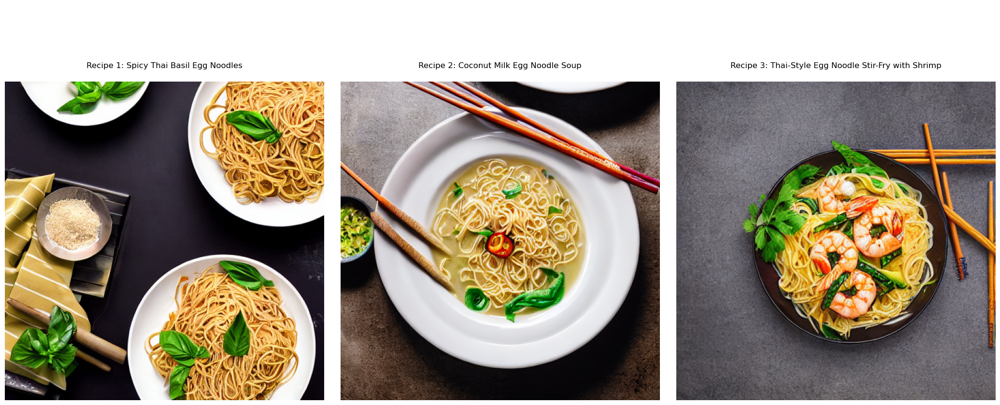

INFO:__main__:Saved image for recipe 1
INFO:__main__:Saved text for recipe 1



Recipe 1:
Title: Spicy Thai Basil Egg Noodles

Recipe Content:
**Recipe 1:**
**Title:**
Spicy Thai Basil Egg Noodles
**Ingredients:**
**
- 1 pound rice noodles
- 2 tablespoons vegetable oil
- 2 cloves garlic, minced
- 1 tablespoon grated fresh ginger
- 1 tablespoon Thai red curry paste
- 2 cups mixed vegetables (bell peppers, carrots, snap peas)
- 1 cup cooked chicken breast, sliced
- 2 tablespoons fish sauce
- 1 tablespoon soy sauce
- 1 tablespoon brown sugar
- 1/4 cup fresh Thai basil leaves
- Salt and pepper to taste
- 2 tablespoons lime juice
**
**Instructions:**
**
1. Cook the rice noodles according to package instructions. Drain and set aside.
2. Heat the oil in a wok or large skillet over medium-high heat. Add the garlic and ginger and stir-fry for 1 minute.
3. Add the curry paste and stir-fry for another minute.
4. Add the mixed vegetables and cooked chicken and stir-fry for 2-3 minutes.
5. Add the cooked noodles, fish sauce, soy sauce, and brown sugar. Stir-fry for 1-2 minute

INFO:__main__:Saved image for recipe 2
INFO:__main__:Saved text for recipe 2
INFO:__main__:Saved image for recipe 3
INFO:__main__:Saved text for recipe 3
INFO:__main__:Saved full recipes to recipes_20241112_150614.json
INFO:__main__:Saved text-only version to recipes_text_20241112_150614.json
INFO:__main__:Cleaning up endpoints...
INFO:sagemaker:Deleting endpoint configuration with name: stable-diffusion-v1-5-2024-11-12-14-58-18-896
INFO:sagemaker:Deleting endpoint with name: stable-diffusion-v1-5-2024-11-12-14-58-18-896
INFO:__main__:Cleanup completed


In [53]:
header_id|>system<|end_header_id|>
You are a helpful assistant that generates re"""
Recipe Generator with Image Creation
Organization:
- Part 1: Configuration and Setup
- Part 2: Recipe Processing
- Part 3: Output Handling
- Part 4: Main Execution
"""

#######################
# Part 1: Configuration and Setup
#######################

# Required imports for Part 1
import logging
import json
import boto3
from sagemaker.jumpstart.model import JumpStartModel
from langchain_community.llms import SagemakerEndpoint
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Recipe generation prompt template
RECIPE_PROMPT =PROMPT = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant that generates recipes in a well-structured format.
Generate THREE (3) COMPLETELY DIFFERENT recipes based on the user's request.
Ensure that ingredients are listed only once in each recipe and avoid repeating any entries. 
The recipes should each include the following sections:
1. **Title** of the recipe
2. **Ingredients List** with measurements (avoid repeats)
3. **Instructions** in numbered steps for preparation

Return the recipes in the following format, ensuring each of the three recipes is structured exactly as follows:

**Recipe 1:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 2:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 3:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

Make sure the formatting follows the above structure exactly and that each recipe is completely unique.
<|eot_id|><|start_header_id|>user<|end_header_id|>
{query}
<|eot_id|><|start_header_id|>assistant<|end_header_id|>"""

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"
    
    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            "parameters": {
                "max_new_tokens": 1000,
                "top_p": 0.9,
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        return json.dumps(payload).encode("utf-8")
        
    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["generated_text"].strip()

def setup_llm(endpoint_name):
    """Initialize the LLM endpoint"""
    sess = boto3.Session()
    region = sess.region_name
    
    llm_content_handler = Llama38BContentHandler()
    
    llm = SagemakerEndpoint(
        endpoint_name=endpoint_name,
        region_name=region,
        model_kwargs={"max_new_tokens": 1000, "top_p": 0.9, "temperature": 0.8},
        content_handler=llm_content_handler
    )
    logger.info("LLM endpoint initialized")
    return llm

def setup_image_model(instance_type="ml.g4dn.xlarge"):
    """Initialize and deploy the image generation model"""
    logger.info("Initializing image generation model...")
    image_model_id = "huggingface-txt2img-runwayml-stable-diffusion-v1-5"
    
    logger.info(f"Using instance type: {instance_type}")
    
    image_model = JumpStartModel(
        model_id=image_model_id,
        model_version="2.0.1",
        instance_type=instance_type
    )
    
    logger.info("Starting image model deployment...")
    image_predictor = image_model.deploy(
        initial_instance_count=1,
        instance_type=instance_type,
        wait=True,
        model_data_download_timeout=1800,
        container_startup_health_check_timeout=1800
    )
    
    # Wait for endpoint to be ready
    sagemaker_client = boto3.client('sagemaker')
    waiter = sagemaker_client.get_waiter('endpoint_in_service')
    
    waiter.wait(
        EndpointName=image_predictor.endpoint_name,
        WaiterConfig={'Delay': 30, 'MaxAttempts': 60}
    )
    logger.info("Endpoint is in service")
    
    return image_predictor

#######################
# Part 2: Recipe Processing
#######################

# Additional imports for Part 2

def extract_title(recipe_text: str) -> Optional[str]:
    """Extract the title from a recipe text."""
    try:
        if "**Title:**" in recipe_text:
            title_section = recipe_text.split("**Title:**")[1]
            lines = [line.strip() for line in title_section.split('\n')]
            
            for line in lines:
                # Skip empty lines, ingredient lines, and section headers
                if not line or line.startswith('-') or line.startswith('*') or "Ingredients" in line or "Instructions" in line:
                    continue
                # Clean up the title
                title = line.replace('*', '').strip()
                if title:
                    return title
    except Exception as e:
        logger.error(f"Error extracting title: {str(e)}")
    return None

def clean_recipe_text(recipe_text: str) -> str:
    """Clean up recipe text formatting."""
    lines = recipe_text.split('\n')
    cleaned_lines = []
    in_title_section = False
    
    for line in lines:
        # Skip empty lines
        if not line.strip():
            continue
        
        # Track if we're in the title section
        if "**Title:**" in line:
            in_title_section = True
            cleaned_lines.append(line)
            continue
        elif "**Ingredients:**" in line:
            in_title_section = False
        
        # Clean up the line
        cleaned_line = line.strip()
        
        # Skip ingredient lines in title section
        if in_title_section and cleaned_line.startswith('-'):
            continue
            
        # Format headers
        if any(header in line for header in ["Title:", "Ingredients:", "Instructions:"]):
            cleaned_line = f"**{cleaned_line}**"
            
        if cleaned_line:
            cleaned_lines.append(cleaned_line)
    
    return '\n'.join(cleaned_lines)

def generate_recipes_with_images(llm, image_predictor, query: str) -> List[Dict]:
    try:
        logger.info(f"Generating recipes for query: {query}")
        
        # Generate recipes
        logger.info("Calling LLM with prompt...")
        response = llm.predict(RECIPE_PROMPT.format(query=query))
        logger.info("Received response from LLM")
        
        # Split and clean up recipes
        recipes_parts = response.split("**Recipe")
        recipe_texts = [text for text in recipes_parts if "Title:" in text]
        
        logger.info(f"Found {len(recipe_texts)} recipe texts")
        
        # Ensure we have exactly 3 recipes
        if len(recipe_texts) != 3:
            logger.warning(f"Got {len(recipe_texts)} recipes instead of 3")
            if len(recipe_texts) > 3:
                recipe_texts = recipe_texts[:3]
            else:
                logger.error("Not enough recipes generated")
                return []
        
        results = []
        for i, recipe_text in enumerate(recipe_texts, 1):
            logger.info(f"\nProcessing recipe {i} of 3")
            
            # Clean and format recipe text
            cleaned_text = clean_recipe_text(recipe_text)
            title = extract_title(cleaned_text)
            
            if not title:
                logger.error(f"Could not extract title from recipe {i}")
                continue
            
            logger.info(f"Found title for recipe {i}: {title}")
            
            try:
                # Generate image
                image_prompt = f"professional food photography of {title}, high resolution, appetizing, styled plating, restaurant quality"
                image_response = image_predictor.predict(
                    image_prompt, 
                    {"ContentType": "application/x-text", "Accept": "application/json"}
                )
                
                if not image_response or 'generated_image' not in image_response:
                    logger.error(f"No image generated for recipe {i}")
                    continue
                
                # Format the recipe text properly
                formatted_text = f"""**Recipe {i}:**
**Title:**
{title}
**Ingredients:**
{cleaned_text.split('**Ingredients:**')[1].split('**Instructions:**')[0].strip()}
**Instructions:**
{cleaned_text.split('**Instructions:**')[1].strip()}"""
                
                results.append({
                    'recipe_text': formatted_text,
                    'title': title,
                    'image_data': image_response.get('generated_image'),
                    'recipe_number': i
                })
                logger.info(f"Successfully processed recipe {i}: {title}")
                
            except Exception as e:
                logger.error(f"Error processing recipe {i}: {str(e)}")
                logger.error(traceback.format_exc())
                continue
        
        return results
        
    except Exception as e:
        logger.error(f"Error in recipe generation: {str(e)}")
        logger.error(traceback.format_exc())
        return []
        
#######################
# Part 3: Output Handling
#######################

# Additional imports for Part 3
import matplotlib.pyplot as plt
from PIL import Image
import io
import numpy as np
from datetime import datetime
import base64

def display_recipes(recipe_results: list):
    """Display recipes with images in a grid layout."""
    if not recipe_results:
        logger.warning("No recipes to display")
        return
        
    # Create subplot grid
    n_recipes = len(recipe_results)
    fig, axes = plt.subplots(1, n_recipes, figsize=(7*n_recipes, 7))
    if n_recipes == 1:
        axes = [axes]
    
    # Display images
    for recipe, ax in zip(recipe_results, axes):
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                ax.imshow(img_array)
                ax.axis('off')
                ax.set_title(f"Recipe {recipe['recipe_number']}: {recipe['title']}", 
                           pad=20, wrap=True)
            except Exception as e:
                logger.error(f"Error displaying image: {str(e)}")
                ax.text(0.5, 0.5, 'Image display failed', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print recipes
    for recipe in recipe_results:
        print(f"\nRecipe {recipe['recipe_number']}:")
        print(f"Title: {recipe['title']}")
        print("\nRecipe Content:")
        print(recipe['recipe_text'])
        print("\n" + "="*50)

def save_recipes(recipe_results: list):
    """Save recipes as text files and images."""
    for recipe in recipe_results:
        # Save image
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                Image.fromarray(img_array).save(f'recipe_image_{recipe["recipe_number"]}.png')
                logger.info(f"Saved image for recipe {recipe['recipe_number']}")
            except Exception as e:
                logger.error(f"Error saving image: {str(e)}")
        
        # Save recipe text
        try:
            with open(f'recipe_{recipe["recipe_number"]}.txt', 'w', encoding='utf-8') as f:
                f.write(f"Title: {recipe['title']}\n\n")
                f.write(recipe['recipe_text'])
            logger.info(f"Saved text for recipe {recipe['recipe_number']}")
        except Exception as e:
            logger.error(f"Error saving recipe text: {str(e)}")

def save_to_json(recipe_results: list):
    """Save recipes to JSON files (full and text-only versions)."""
    try:
        recipes_data = {
            'metadata': {
                'generated_date': datetime.now().isoformat(),
                'number_of_recipes': len(recipe_results)
            },
            'recipes': []
        }
        
        for recipe in recipe_results:
            # Convert image data to base64
            image_data = None
            if recipe['image_data'] is not None:
                try:
                    if isinstance(recipe['image_data'], list):
                        image_bytes = np.array(recipe['image_data'], dtype=np.uint8).tobytes()
                    else:
                        image_bytes = recipe['image_data']
                    image_data = base64.b64encode(image_bytes).decode('utf-8')
                except Exception as e:
                    logger.warning(f"Could not encode image: {str(e)}")
            
            recipes_data['recipes'].append({
                'recipe_number': recipe['recipe_number'],
                'title': recipe['title'],
                'recipe_text': recipe['recipe_text'],
                'image_data': image_data
            })
        
        # Save full version
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f'recipes_{timestamp}.json'
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(recipes_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved full recipes to {filename}")
        
        # Save text-only version
        text_filename = f'recipes_text_{timestamp}.json'
        text_data = {
            'metadata': recipes_data['metadata'],
            'recipes': [{k: v for k, v in r.items() if k != 'image_data'} 
                       for r in recipes_data['recipes']]
        }
        with open(text_filename, 'w', encoding='utf-8') as f:
            json.dump(text_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved text-only version to {text_filename}")
        
        return filename, text_filename
    except Exception as e:
        logger.error(f"Error saving to JSON: {str(e)}")
        return None, None

#######################
# Part 4: Main Execution
#######################

def main():
    image_predictor = None
    try:
        # Initialize LLM
        llm = setup_llm("meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325")
        
        # Setup image model
        image_predictor = setup_image_model()
        
        # Generate recipes
        query = "I am allergic to nuts. Can you give me a Thai egg noodle recipe free of nuts?"
        recipe_results = generate_recipes_with_images(llm, image_predictor, query)
        
        if recipe_results:
            # Display and save results
            display_recipes(recipe_results)
            save_recipes(recipe_results)
            save_to_json(recipe_results)
        else:
            logger.error("No recipes were generated")
            
    except Exception as e:
        logger.error(f"Error in main execution: {str(e)}")
    finally:
        if image_predictor:
            try:
                logger.info("Cleaning up endpoints...")
                image_predictor.delete_endpoint()
                logger.info("Cleanup completed")
            except Exception as e:
                logger.error(f"Error during cleanup: {str(e)}")

if __name__ == "__main__":
    main()

#### Italian - Gluten (Wheat)

INFO:__main__:LLM endpoint initialized
INFO:__main__:Initializing image generation model...
INFO:__main__:Using instance type: ml.g4dn.xlarge
INFO:__main__:Starting image model deployment...
INFO:sagemaker:Creating model with name: stable-diffusion-v1-5-2024-11-12-16-24-41-611
INFO:sagemaker:Creating endpoint-config with name stable-diffusion-v1-5-2024-11-12-16-24-41-613
INFO:sagemaker:Creating endpoint with name stable-diffusion-v1-5-2024-11-12-16-24-41-613


--------------!

INFO:__main__:Endpoint is in service
INFO:__main__:Generating recipes for query: I am allergic to wheat (gluten). Can you give me an Italian chicken recipe that's gluten-free?
INFO:__main__:Calling LLM with prompt...
INFO:__main__:Received response from LLM
INFO:__main__:Found 3 recipe texts
INFO:__main__:
Processing recipe 1 of 3
INFO:__main__:Found title for recipe 1: Chicken Parmesan with Zucchini Noodles
INFO:__main__:Successfully processed recipe 1: Chicken Parmesan with Zucchini Noodles
INFO:__main__:
Processing recipe 2 of 3
INFO:__main__:Found title for recipe 2: Chicken and Mushroom Risotto with White Wine
INFO:__main__:Successfully processed recipe 2: Chicken and Mushroom Risotto with White Wine
INFO:__main__:
Processing recipe 3 of 3
INFO:__main__:Found title for recipe 3: Chicken and Spinach Stuffed Bell Peppers
INFO:__main__:Successfully processed recipe 3: Chicken and Spinach Stuffed Bell Peppers


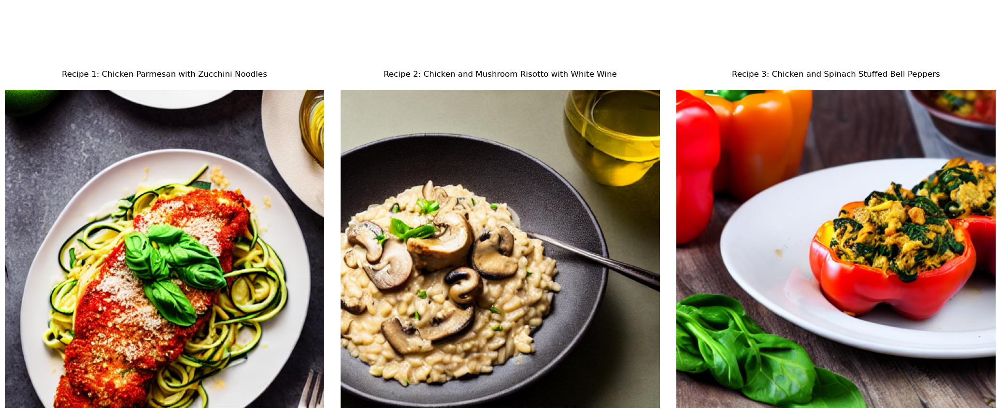

INFO:__main__:Saved image for recipe 1
INFO:__main__:Saved text for recipe 1



Recipe 1:
Title: Chicken Parmesan with Zucchini Noodles

Recipe Content:
**Recipe 1:**
**Title:**
Chicken Parmesan with Zucchini Noodles
**Ingredients:**
**
- 4 boneless, skinless chicken breasts
- 1 cup gluten-free breadcrumbs (made from rice or corn)
- 1/2 cup grated Parmesan cheese
- 1 egg
- 1/4 cup olive oil
- 2 medium zucchinis
- Salt and pepper to taste
- Fresh basil leaves for garnish
**
**Instructions:**
**
1. Preheat oven to 400°F (200°C).
2. In a shallow dish, mix together breadcrumbs and Parmesan cheese.
3. Dip each chicken breast in the egg and then coat in the breadcrumb mixture.
4. Heat olive oil in a large skillet over medium-high heat. Cook chicken for 3-4 minutes per side, or until cooked through.
5. Meanwhile, spiralize zucchinis into noodles and sauté in a separate skillet with a little olive oil until tender.
6. Serve chicken on top of zucchini noodles and garnish with basil leaves.


Recipe 2:
Title: Chicken and Mushroom Risotto with White Wine

Recipe Content:
**

INFO:__main__:Saved image for recipe 2
INFO:__main__:Saved text for recipe 2
INFO:__main__:Saved image for recipe 3
INFO:__main__:Saved text for recipe 3
INFO:__main__:Saved full recipes to recipes_20241112_163404.json
INFO:__main__:Saved text-only version to recipes_text_20241112_163404.json
INFO:__main__:Cleaning up endpoints...
INFO:sagemaker:Deleting endpoint configuration with name: stable-diffusion-v1-5-2024-11-12-16-24-41-613
INFO:sagemaker:Deleting endpoint with name: stable-diffusion-v1-5-2024-11-12-16-24-41-613
INFO:__main__:Cleanup completed


In [54]:
"""
Recipe Generator with Image Creation
Organization:
- Part 1: Configuration and Setup
- Part 2: Recipe Processing
- Part 3: Output Handling
- Part 4: Main Execution
"""

#######################
# Part 1: Configuration and Setup
#######################

# Required imports for Part 1
import logging
import json
import boto3
from sagemaker.jumpstart.model import JumpStartModel
from langchain_community.llms import SagemakerEndpoint
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Recipe generation prompt template
RECIPE_PROMPT =PROMPT = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant that generates recipes in a well-structured format.
Generate THREE (3) COMPLETELY DIFFERENT recipes based on the user's request.
Ensure that ingredients are listed only once in each recipe and avoid repeating any entries. 
The recipes should each include the following sections:
1. **Title** of the recipe
2. **Ingredients List** with measurements (avoid repeats)
3. **Instructions** in numbered steps for preparation

Return the recipes in the following format, ensuring each of the three recipes is structured exactly as follows:

**Recipe 1:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 2:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 3:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

Make sure the formatting follows the above structure exactly and that each recipe is completely unique.
<|eot_id|><|start_header_id|>user<|end_header_id|>
{query}
<|eot_id|><|start_header_id|>assistant<|end_header_id|>"""

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"
    
    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            "parameters": {
                "max_new_tokens": 1000,
                "top_p": 0.9,
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        return json.dumps(payload).encode("utf-8")
        
    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["generated_text"].strip()

def setup_llm(endpoint_name):
    """Initialize the LLM endpoint"""
    sess = boto3.Session()
    region = sess.region_name
    
    llm_content_handler = Llama38BContentHandler()
    
    llm = SagemakerEndpoint(
        endpoint_name=endpoint_name,
        region_name=region,
        model_kwargs={"max_new_tokens": 1000, "top_p": 0.9, "temperature": 0.8},
        content_handler=llm_content_handler
    )
    logger.info("LLM endpoint initialized")
    return llm

def setup_image_model(instance_type="ml.g4dn.xlarge"):
    """Initialize and deploy the image generation model"""
    logger.info("Initializing image generation model...")
    image_model_id = "huggingface-txt2img-runwayml-stable-diffusion-v1-5"
    
    logger.info(f"Using instance type: {instance_type}")
    
    image_model = JumpStartModel(
        model_id=image_model_id,
        model_version="2.0.1",
        instance_type=instance_type
    )
    
    logger.info("Starting image model deployment...")
    image_predictor = image_model.deploy(
        initial_instance_count=1,
        instance_type=instance_type,
        wait=True,
        model_data_download_timeout=1800,
        container_startup_health_check_timeout=1800
    )
    
    # Wait for endpoint to be ready
    sagemaker_client = boto3.client('sagemaker')
    waiter = sagemaker_client.get_waiter('endpoint_in_service')
    
    waiter.wait(
        EndpointName=image_predictor.endpoint_name,
        WaiterConfig={'Delay': 30, 'MaxAttempts': 60}
    )
    logger.info("Endpoint is in service")
    
    return image_predictor

#######################
# Part 2: Recipe Processing
#######################

# Additional imports for Part 2
def extract_title(recipe_text: str) -> Optional[str]:
    """Extract the title from a recipe text."""
    try:
        if "**Title:**" in recipe_text:
            title_section = recipe_text.split("**Title:**")[1]
            lines = [line.strip() for line in title_section.split('\n')]
            
            for line in lines:
                # Skip empty lines, ingredient lines, and section headers
                if not line or line.startswith('-') or line.startswith('*') or "Ingredients" in line or "Instructions" in line:
                    continue
                # Clean up the title
                title = line.replace('*', '').strip()
                if title:
                    return title
    except Exception as e:
        logger.error(f"Error extracting title: {str(e)}")
    return None

def clean_recipe_text(recipe_text: str) -> str:
    """Clean up recipe text formatting."""
    lines = recipe_text.split('\n')
    cleaned_lines = []
    in_title_section = False
    
    for line in lines:
        # Skip empty lines
        if not line.strip():
            continue
        
        # Track if we're in the title section
        if "**Title:**" in line:
            in_title_section = True
            cleaned_lines.append(line)
            continue
        elif "**Ingredients:**" in line:
            in_title_section = False
        
        # Clean up the line
        cleaned_line = line.strip()
        
        # Skip ingredient lines in title section
        if in_title_section and cleaned_line.startswith('-'):
            continue
            
        # Format headers
        if any(header in line for header in ["Title:", "Ingredients:", "Instructions:"]):
            cleaned_line = f"**{cleaned_line}**"
            
        if cleaned_line:
            cleaned_lines.append(cleaned_line)
    
    return '\n'.join(cleaned_lines)

def generate_recipes_with_images(llm, image_predictor, query: str) -> List[Dict]:
    try:
        logger.info(f"Generating recipes for query: {query}")
        
        # Generate recipes
        logger.info("Calling LLM with prompt...")
        response = llm.predict(RECIPE_PROMPT.format(query=query))
        logger.info("Received response from LLM")
        
        # Split and clean up recipes
        recipes_parts = response.split("**Recipe")
        recipe_texts = [text for text in recipes_parts if "Title:" in text]
        
        logger.info(f"Found {len(recipe_texts)} recipe texts")
        
        # Ensure we have exactly 3 recipes
        if len(recipe_texts) != 3:
            logger.warning(f"Got {len(recipe_texts)} recipes instead of 3")
            if len(recipe_texts) > 3:
                recipe_texts = recipe_texts[:3]
            else:
                logger.error("Not enough recipes generated")
                return []
        
        results = []
        for i, recipe_text in enumerate(recipe_texts, 1):
            logger.info(f"\nProcessing recipe {i} of 3")
            
            # Clean and format recipe text
            cleaned_text = clean_recipe_text(recipe_text)
            title = extract_title(cleaned_text)
            
            if not title:
                logger.error(f"Could not extract title from recipe {i}")
                continue
            
            logger.info(f"Found title for recipe {i}: {title}")
            
            try:
                # Generate image
                image_prompt = f"professional food photography of {title}, high resolution, appetizing, styled plating, restaurant quality"
                image_response = image_predictor.predict(
                    image_prompt, 
                    {"ContentType": "application/x-text", "Accept": "application/json"}
                )
                if not image_response or 'generated_image' not in image_response:
                    logger.error(f"No image generated for recipe {i}")
                    continue
                
                # Format the recipe text properly
                formatted_text = f"""**Recipe {i}:**
**Title:**
{title}
**Ingredients:**
{cleaned_text.split('**Ingredients:**')[1].split('**Instructions:**')[0].strip()}
**Instructions:**
{cleaned_text.split('**Instructions:**')[1].strip()}"""
                
                results.append({
                    'recipe_text': formatted_text,
                    'title': title,
                    'image_data': image_response.get('generated_image'),
                    'recipe_number': i
                })
                logger.info(f"Successfully processed recipe {i}: {title}")
                
            except Exception as e:
                logger.error(f"Error processing recipe {i}: {str(e)}")
                logger.error(traceback.format_exc())
                continue
        
        return results
        
    except Exception as e:
        logger.error(f"Error in recipe generation: {str(e)}")
        logger.error(traceback.format_exc())
        return []
#######################
# Part 3: Output Handling
#######################

# Additional imports for Part 3
import matplotlib.pyplot as plt
from PIL import Image
import io
import numpy as np
from datetime import datetime
import base64

def display_recipes(recipe_results: list):
    """Display recipes with images in a grid layout."""
    if not recipe_results:
        logger.warning("No recipes to display")
        return
        
    # Create subplot grid
    n_recipes = len(recipe_results)
    fig, axes = plt.subplots(1, n_recipes, figsize=(7*n_recipes, 7))
    if n_recipes == 1:
        axes = [axes]
    
    # Display images
    for recipe, ax in zip(recipe_results, axes):
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                ax.imshow(img_array)
                ax.axis('off')
                ax.set_title(f"Recipe {recipe['recipe_number']}: {recipe['title']}", 
                           pad=20, wrap=True)
            except Exception as e:
                logger.error(f"Error displaying image: {str(e)}")
                ax.text(0.5, 0.5, 'Image display failed', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print recipes
    for recipe in recipe_results:
        print(f"\nRecipe {recipe['recipe_number']}:")
        print(f"Title: {recipe['title']}")
        print("\nRecipe Content:")
        print(recipe['recipe_text'])
        print("\n" + "="*50)

def save_recipes(recipe_results: list):
    """Save recipes as text files and images."""
    for recipe in recipe_results:
        # Save image
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                Image.fromarray(img_array).save(f'recipe_image_{recipe["recipe_number"]}.png')
                logger.info(f"Saved image for recipe {recipe['recipe_number']}")
            except Exception as e:
                logger.error(f"Error saving image: {str(e)}")
        
        # Save recipe text
        try:
            with open(f'recipe_{recipe["recipe_number"]}.txt', 'w', encoding='utf-8') as f:
                f.write(f"Title: {recipe['title']}\n\n")
                f.write(recipe['recipe_text'])
            logger.info(f"Saved text for recipe {recipe['recipe_number']}")
        except Exception as e:
            logger.error(f"Error saving recipe text: {str(e)}")

def save_to_json(recipe_results: list):
    """Save recipes to JSON files (full and text-only versions)."""
    try:
        recipes_data = {
            'metadata': {
                'generated_date': datetime.now().isoformat(),
                'number_of_recipes': len(recipe_results)
            },
            'recipes': []
        }
        
        for recipe in recipe_results:
            # Convert image data to base64
            image_data = None
            if recipe['image_data'] is not None:
                try:
                    if isinstance(recipe['image_data'], list):
                        image_bytes = np.array(recipe['image_data'], dtype=np.uint8).tobytes()
                    else:
                        image_bytes = recipe['image_data']
                    image_data = base64.b64encode(image_bytes).decode('utf-8')
                except Exception as e:
                    logger.warning(f"Could not encode image: {str(e)}")
            
            recipes_data['recipes'].append({
                'recipe_number': recipe['recipe_number'],
                'title': recipe['title'],
                'recipe_text': recipe['recipe_text'],
                'image_data': image_data
            })
        
        # Save full version
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f'recipes_{timestamp}.json'
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(recipes_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved full recipes to {filename}")
        
        # Save text-only version
        text_filename = f'recipes_text_{timestamp}.json'
        text_data = {
            'metadata': recipes_data['metadata'],
            'recipes': [{k: v for k, v in r.items() if k != 'image_data'} 
                       for r in recipes_data['recipes']]
        }
        with open(text_filename, 'w', encoding='utf-8') as f:
            json.dump(text_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved text-only version to {text_filename}")
        
        return filename, text_filename
    except Exception as e:
        logger.error(f"Error saving to JSON: {str(e)}")
        return None, None

#######################
# Part 4: Main Execution
#######################

def main():
    image_predictor = None
    try:
        # Initialize LLM
        llm = setup_llm("meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325")
        
        # Setup image model
        image_predictor = setup_image_model()
        
        # Generate recipes
        query = "I am allergic to wheat (gluten). Can you give me an Italian chicken recipe that's gluten-free?"
        recipe_results = generate_recipes_with_images(llm, image_predictor, query)
        
        if recipe_results:
            # Display and save results
            display_recipes(recipe_results)
            save_recipes(recipe_results)
            save_to_json(recipe_results)
        else:
            logger.error("No recipes were generated")
            
    except Exception as e:
        logger.error(f"Error in main execution: {str(e)}")
    finally:
        if image_predictor:
            try:
                logger.info("Cleaning up endpoints...")
                image_predictor.delete_endpoint()
                logger.info("Cleanup completed")
            except Exception as e:
                logger.error(f"Error during cleanup: {str(e)}")

if __name__ == "__main__":
    main()

#### Dessert - Milk & Egg

INFO:__main__:LLM endpoint initialized
INFO:__main__:Initializing image generation model...
INFO:__main__:Using instance type: ml.g4dn.xlarge
INFO:__main__:Starting image model deployment...
INFO:sagemaker:Creating model with name: stable-diffusion-v1-5-2024-11-12-16-34-13-226
INFO:sagemaker:Creating endpoint-config with name stable-diffusion-v1-5-2024-11-12-16-34-13-227
INFO:sagemaker:Creating endpoint with name stable-diffusion-v1-5-2024-11-12-16-34-13-227


------------!

INFO:__main__:Endpoint is in service
INFO:__main__:Generating recipes for query: I am allergic to milk and eggs. Can you give me a dessert recipe free from these allergens?
INFO:__main__:Calling LLM with prompt...
INFO:__main__:Received response from LLM
INFO:__main__:Found 3 recipe texts
INFO:__main__:
Processing recipe 1 of 3
INFO:__main__:Found title for recipe 1: Coconut Lime Panna Cotta with Fresh Berries
INFO:__main__:Successfully processed recipe 1: Coconut Lime Panna Cotta with Fresh Berries
INFO:__main__:
Processing recipe 2 of 3
INFO:__main__:Found title for recipe 2: Chocolate Avocado Mousse
INFO:__main__:Successfully processed recipe 2: Chocolate Avocado Mousse
INFO:__main__:
Processing recipe 3 of 3
INFO:__main__:Found title for recipe 3: Banana "Nice" Cream
INFO:__main__:Successfully processed recipe 3: Banana "Nice" Cream


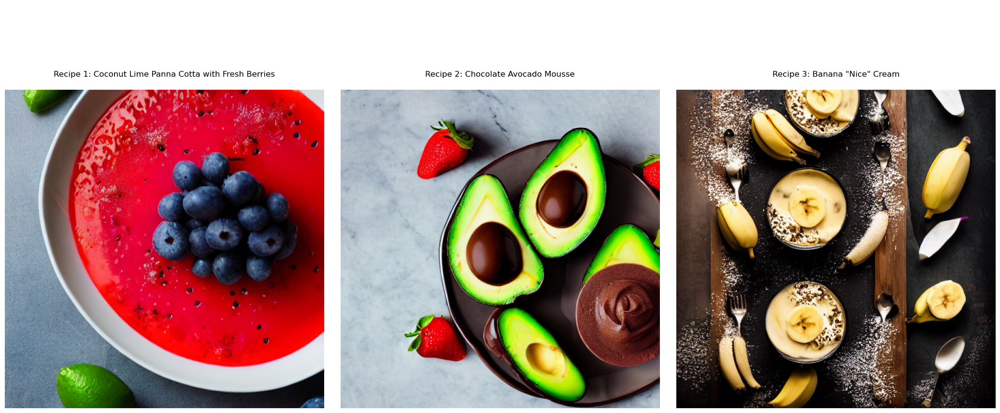

INFO:__main__:Saved image for recipe 1
INFO:__main__:Saved text for recipe 1



Recipe 1:
Title: Coconut Lime Panna Cotta with Fresh Berries

Recipe Content:
**Recipe 1:**
**Title:**
Coconut Lime Panna Cotta with Fresh Berries
**Ingredients:**
**
- 1 can of full-fat coconut milk
- 1/4 cup of maple syrup
- 1 tablespoon of lime juice
- 1 teaspoon of vanilla extract
- 1/4 teaspoon of salt
- 1 cup of fresh mixed berries (such as raspberries, blueberries, and blackberries)
**
**Instructions:**
**
1. In a medium saucepan, combine the coconut milk, maple syrup, lime juice, vanilla extract, and salt. Whisk until the mixture is smooth.
2. Bring the mixture to a simmer over medium heat, whisking constantly.
3. Reduce the heat to low and let it cook for 5-7 minutes, or until the mixture has thickened slightly.
4. Remove from heat and let it cool to room temperature.
5. Pour the mixture into individual serving cups or a large serving dish. Cover with plastic wrap and refrigerate for at least 4 hours or overnight.
6. Just before serving, top with fresh mixed berries.


Recipe

INFO:__main__:Saved image for recipe 2
INFO:__main__:Saved text for recipe 2
INFO:__main__:Saved image for recipe 3
INFO:__main__:Saved text for recipe 3
INFO:__main__:Saved full recipes to recipes_20241112_164231.json
INFO:__main__:Saved text-only version to recipes_text_20241112_164231.json
INFO:__main__:Cleaning up endpoints...
INFO:sagemaker:Deleting endpoint configuration with name: stable-diffusion-v1-5-2024-11-12-16-34-13-227
INFO:sagemaker:Deleting endpoint with name: stable-diffusion-v1-5-2024-11-12-16-34-13-227
INFO:__main__:Cleanup completed


In [55]:
"""
Recipe Generator with Image Creation
Organization:
- Part 1: Configuration and Setup
- Part 2: Recipe Processing
- Part 3: Output Handling
- Part 4: Main Execution
"""

#######################
# Part 1: Configuration and Setup
#######################

# Required imports for Part 1
import logging
import json
import boto3
from sagemaker.jumpstart.model import JumpStartModel
from langchain_community.llms import SagemakerEndpoint
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Recipe generation prompt template
RECIPE_PROMPT =PROMPT = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant that generates recipes in a well-structured format.
Generate THREE (3) COMPLETELY DIFFERENT recipes based on the user's request.
Ensure that ingredients are listed only once in each recipe and avoid repeating any entries. 
The recipes should each include the following sections:
1. **Title** of the recipe
2. **Ingredients List** with measurements (avoid repeats)
3. **Instructions** in numbered steps for preparation

Return the recipes in the following format, ensuring each of the three recipes is structured exactly as follows:

**Recipe 1:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 2:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 3:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

Make sure the formatting follows the above structure exactly and that each recipe is completely unique.
<|eot_id|><|start_header_id|>user<|end_header_id|>
{query}
<|eot_id|><|start_header_id|>assistant<|end_header_id|>"""

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"
    
    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            "parameters": {
                "max_new_tokens": 1000,
                "top_p": 0.9,
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        return json.dumps(payload).encode("utf-8")
        
    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["generated_text"].strip()

def setup_llm(endpoint_name):
    """Initialize the LLM endpoint"""
    sess = boto3.Session()
    region = sess.region_name
    
    llm_content_handler = Llama38BContentHandler()
    
    llm = SagemakerEndpoint(
        endpoint_name=endpoint_name,
        region_name=region,
        model_kwargs={"max_new_tokens": 1000, "top_p": 0.9, "temperature": 0.8},
        content_handler=llm_content_handler
    )
    logger.info("LLM endpoint initialized")
    return llm

def setup_image_model(instance_type="ml.g4dn.xlarge"):
    """Initialize and deploy the image generation model"""
    logger.info("Initializing image generation model...")
    image_model_id = "huggingface-txt2img-runwayml-stable-diffusion-v1-5"
    
    logger.info(f"Using instance type: {instance_type}")
    
    image_model = JumpStartModel(
        model_id=image_model_id,
        model_version="2.0.1",
        instance_type=instance_type
    )
    
    logger.info("Starting image model deployment...")
    image_predictor = image_model.deploy(
        initial_instance_count=1,
        instance_type=instance_type,
        wait=True,
        model_data_download_timeout=1800,
        container_startup_health_check_timeout=1800
    )
    
    # Wait for endpoint to be ready
    sagemaker_client = boto3.client('sagemaker')
    waiter = sagemaker_client.get_waiter('endpoint_in_service')
    
    waiter.wait(
        EndpointName=image_predictor.endpoint_name,
        WaiterConfig={'Delay': 30, 'MaxAttempts': 60}
    )
    logger.info("Endpoint is in service")
    
    return image_predictor

#######################
# Part 2: Recipe Processing
#######################

# Additional imports for Part 2
def extract_title(recipe_text: str) -> Optional[str]:
    """Extract the title from a recipe text."""
    try:
        if "**Title:**" in recipe_text:
            title_section = recipe_text.split("**Title:**")[1]
            lines = [line.strip() for line in title_section.split('\n')]
            
            for line in lines:
                # Skip empty lines, ingredient lines, and section headers
                if not line or line.startswith('-') or line.startswith('*') or "Ingredients" in line or "Instructions" in line:
                    continue
                # Clean up the title
                title = line.replace('*', '').strip()
                if title:
                    return title
    except Exception as e:
        logger.error(f"Error extracting title: {str(e)}")
    return None

def clean_recipe_text(recipe_text: str) -> str:
    """Clean up recipe text formatting."""
    lines = recipe_text.split('\n')
    cleaned_lines = []
    in_title_section = False
    
    for line in lines:
        # Skip empty lines
        if not line.strip():
            continue
        
        # Track if we're in the title section
        if "**Title:**" in line:
            in_title_section = True
            cleaned_lines.append(line)
            continue
        elif "**Ingredients:**" in line:
            in_title_section = False
        
        # Clean up the line
        cleaned_line = line.strip()
        
        # Skip ingredient lines in title section
        if in_title_section and cleaned_line.startswith('-'):
            continue
            
        # Format headers
        if any(header in line for header in ["Title:", "Ingredients:", "Instructions:"]):
            cleaned_line = f"**{cleaned_line}**"
            
        if cleaned_line:
            cleaned_lines.append(cleaned_line)
    
    return '\n'.join(cleaned_lines)

def generate_recipes_with_images(llm, image_predictor, query: str) -> List[Dict]:
    try:
        logger.info(f"Generating recipes for query: {query}")
        
        # Generate recipes
        logger.info("Calling LLM with prompt...")
        response = llm.predict(RECIPE_PROMPT.format(query=query))
        logger.info("Received response from LLM")
        
        # Split and clean up recipes
        recipes_parts = response.split("**Recipe")
        recipe_texts = [text for text in recipes_parts if "Title:" in text]
        
        logger.info(f"Found {len(recipe_texts)} recipe texts")
        
        # Ensure we have exactly 3 recipes
        if len(recipe_texts) != 3:
            logger.warning(f"Got {len(recipe_texts)} recipes instead of 3")
            if len(recipe_texts) > 3:
                recipe_texts = recipe_texts[:3]
            else:
                logger.error("Not enough recipes generated")
                return []
        
        results = []
        for i, recipe_text in enumerate(recipe_texts, 1):
            logger.info(f"\nProcessing recipe {i} of 3")
            
            # Clean and format recipe text
            cleaned_text = clean_recipe_text(recipe_text)
            title = extract_title(cleaned_text)
            
            if not title:
                logger.error(f"Could not extract title from recipe {i}")
                continue
            
            logger.info(f"Found title for recipe {i}: {title}")
            
            try:
                # Generate image
                image_prompt = f"professional food photography of {title}, high resolution, appetizing, styled plating, restaurant quality"
                image_response = image_predictor.predict(
                    image_prompt, 
                    {"ContentType": "application/x-text", "Accept": "application/json"}
                )
                if not image_response or 'generated_image' not in image_response:
                    logger.error(f"No image generated for recipe {i}")
                    continue
                
                # Format the recipe text properly
                formatted_text = f"""**Recipe {i}:**
**Title:**
{title}
**Ingredients:**
{cleaned_text.split('**Ingredients:**')[1].split('**Instructions:**')[0].strip()}
**Instructions:**
{cleaned_text.split('**Instructions:**')[1].strip()}"""
                
                results.append({
                    'recipe_text': formatted_text,
                    'title': title,
                    'image_data': image_response.get('generated_image'),
                    'recipe_number': i
                })
                logger.info(f"Successfully processed recipe {i}: {title}")
                
            except Exception as e:
                logger.error(f"Error processing recipe {i}: {str(e)}")
                logger.error(traceback.format_exc())
                continue
        
        return results
        
    except Exception as e:
        logger.error(f"Error in recipe generation: {str(e)}")
        logger.error(traceback.format_exc())
        return []
#######################
# Part 3: Output Handling
#######################

# Additional imports for Part 3
import matplotlib.pyplot as plt
from PIL import Image
import io
import numpy as np
from datetime import datetime
import base64

def display_recipes(recipe_results: list):
    """Display recipes with images in a grid layout."""
    if not recipe_results:
        logger.warning("No recipes to display")
        return
        
    # Create subplot grid
    n_recipes = len(recipe_results)
    fig, axes = plt.subplots(1, n_recipes, figsize=(7*n_recipes, 7))
    if n_recipes == 1:
        axes = [axes]
    
    # Display images
    for recipe, ax in zip(recipe_results, axes):
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                ax.imshow(img_array)
                ax.axis('off')
                ax.set_title(f"Recipe {recipe['recipe_number']}: {recipe['title']}", 
                           pad=20, wrap=True)
            except Exception as e:
                logger.error(f"Error displaying image: {str(e)}")
                ax.text(0.5, 0.5, 'Image display failed', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print recipes
    for recipe in recipe_results:
        print(f"\nRecipe {recipe['recipe_number']}:")
        print(f"Title: {recipe['title']}")
        print("\nRecipe Content:")
        print(recipe['recipe_text'])
        print("\n" + "="*50)

def save_recipes(recipe_results: list):
    """Save recipes as text files and images."""
    for recipe in recipe_results:
        # Save image
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                Image.fromarray(img_array).save(f'recipe_image_{recipe["recipe_number"]}.png')
                logger.info(f"Saved image for recipe {recipe['recipe_number']}")
            except Exception as e:
                logger.error(f"Error saving image: {str(e)}")
        
        # Save recipe text
        try:
            with open(f'recipe_{recipe["recipe_number"]}.txt', 'w', encoding='utf-8') as f:
                f.write(f"Title: {recipe['title']}\n\n")
                f.write(recipe['recipe_text'])
            logger.info(f"Saved text for recipe {recipe['recipe_number']}")
        except Exception as e:
            logger.error(f"Error saving recipe text: {str(e)}")

def save_to_json(recipe_results: list):
    """Save recipes to JSON files (full and text-only versions)."""
    try:
        recipes_data = {
            'metadata': {
                'generated_date': datetime.now().isoformat(),
                'number_of_recipes': len(recipe_results)
            },
            'recipes': []
        }
        
        for recipe in recipe_results:
            # Convert image data to base64
            image_data = None
            if recipe['image_data'] is not None:
                try:
                    if isinstance(recipe['image_data'], list):
                        image_bytes = np.array(recipe['image_data'], dtype=np.uint8).tobytes()
                    else:
                        image_bytes = recipe['image_data']
                    image_data = base64.b64encode(image_bytes).decode('utf-8')
                except Exception as e:
                    logger.warning(f"Could not encode image: {str(e)}")
            
            recipes_data['recipes'].append({
                'recipe_number': recipe['recipe_number'],
                'title': recipe['title'],
                'recipe_text': recipe['recipe_text'],
                'image_data': image_data
            })
        
        # Save full version
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f'recipes_{timestamp}.json'
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(recipes_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved full recipes to {filename}")
        
        # Save text-only version
        text_filename = f'recipes_text_{timestamp}.json'
        text_data = {
            'metadata': recipes_data['metadata'],
            'recipes': [{k: v for k, v in r.items() if k != 'image_data'} 
                       for r in recipes_data['recipes']]
        }
        with open(text_filename, 'w', encoding='utf-8') as f:
            json.dump(text_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved text-only version to {text_filename}")
        
        return filename, text_filename
    except Exception as e:
        logger.error(f"Error saving to JSON: {str(e)}")
        return None, None

#######################
# Part 4: Main Execution
#######################

def main():
    image_predictor = None
    try:
        # Initialize LLM
        llm = setup_llm("meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325")
        
        # Setup image model
        image_predictor = setup_image_model()
        
        # Generate recipes
        query = "I am allergic to milk and eggs. Can you give me a dessert recipe free from these allergens?"
        recipe_results = generate_recipes_with_images(llm, image_predictor, query)
        
        if recipe_results:
            # Display and save results
            display_recipes(recipe_results)
            save_recipes(recipe_results)
            save_to_json(recipe_results)
        else:
            logger.error("No recipes were generated")
            
    except Exception as e:
        logger.error(f"Error in main execution: {str(e)}")
    finally:
        if image_predictor:
            try:
                logger.info("Cleaning up endpoints...")
                image_predictor.delete_endpoint()
                logger.info("Cleanup completed")
            except Exception as e:
                logger.error(f"Error during cleanup: {str(e)}")

if __name__ == "__main__":
    main()

#### Vegan - Soy

INFO:__main__:LLM endpoint initialized
INFO:__main__:Initializing image generation model...
INFO:__main__:Using instance type: ml.g4dn.xlarge
INFO:__main__:Starting image model deployment...
INFO:sagemaker:Creating model with name: stable-diffusion-v1-5-2024-11-12-16-44-23-830
INFO:sagemaker:Creating endpoint-config with name stable-diffusion-v1-5-2024-11-12-16-44-23-832
INFO:sagemaker:Creating endpoint with name stable-diffusion-v1-5-2024-11-12-16-44-23-832


-----------!

INFO:__main__:Endpoint is in service
INFO:__main__:Generating recipes for query: I am allergic to soy. Can you give me a vegan taco recipe without soy?
INFO:__main__:Calling LLM with prompt...
INFO:__main__:Received response from LLM
INFO:__main__:Found 3 recipe texts
INFO:__main__:
Processing recipe 1 of 3
INFO:__main__:Found title for recipe 1: Black Bean and Sweet Potato Tacos
INFO:__main__:Successfully processed recipe 1: Black Bean and Sweet Potato Tacos
INFO:__main__:
Processing recipe 2 of 3
INFO:__main__:Found title for recipe 2: Grilled Portobello Mushroom Tacos
INFO:__main__:Successfully processed recipe 2: Grilled Portobello Mushroom Tacos
INFO:__main__:
Processing recipe 3 of 3
INFO:__main__:Found title for recipe 3: Roasted Cauliflower and Avocado Tacos
INFO:__main__:Successfully processed recipe 3: Roasted Cauliflower and Avocado Tacos


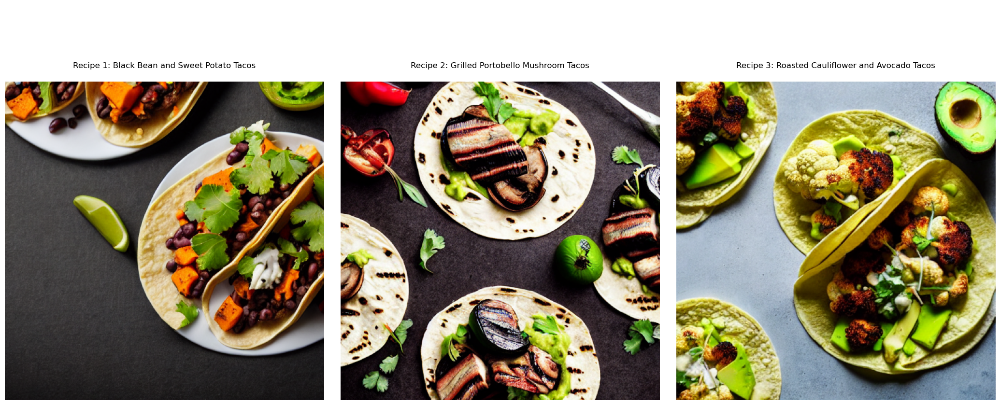

INFO:__main__:Saved image for recipe 1
INFO:__main__:Saved text for recipe 1



Recipe 1:
Title: Black Bean and Sweet Potato Tacos

Recipe Content:
**Recipe 1:**
**Title:**
Black Bean and Sweet Potato Tacos
**Ingredients:**
**
- 1 medium sweet potato, peeled and diced
- 1 can black beans, drained and rinsed
- 1 onion, diced
- 2 cloves garlic, minced
- 1 tablespoon olive oil
- 1 teaspoon cumin
- 1 teaspoon chili powder
- Salt and pepper, to taste
- 4 corn tortillas
- Optional toppings: avocado, salsa, cilantro, lime wedges
**
**Instructions:**
**
1. Preheat oven to 400°F (200°C).
2. Toss sweet potato with 1/2 tablespoon olive oil, cumin, and chili powder. Roast for 20-25 minutes, or until tender.
3. In a large pan, heat the remaining 1/2 tablespoon olive oil over medium heat. Add onion and cook until softened, about 5 minutes. Add garlic and cook for an additional minute.
4. Add black beans to the pan and stir to combine with onion and garlic. Season with salt and pepper to taste.
5. Warm tortillas by wrapping them in a damp paper towel and microwaving for 20-30 s

INFO:__main__:Saved image for recipe 2
INFO:__main__:Saved text for recipe 2
INFO:__main__:Saved image for recipe 3
INFO:__main__:Saved text for recipe 3
INFO:__main__:Saved full recipes to recipes_20241112_165218.json
INFO:__main__:Saved text-only version to recipes_text_20241112_165218.json
INFO:__main__:Cleaning up endpoints...
INFO:sagemaker:Deleting endpoint configuration with name: stable-diffusion-v1-5-2024-11-12-16-44-23-832
INFO:sagemaker:Deleting endpoint with name: stable-diffusion-v1-5-2024-11-12-16-44-23-832
INFO:__main__:Cleanup completed


In [56]:
"""
Recipe Generator with Image Creation
Organization:
- Part 1: Configuration and Setup
- Part 2: Recipe Processing
- Part 3: Output Handling
- Part 4: Main Execution
"""

#######################
# Part 1: Configuration and Setup
#######################

# Required imports for Part 1
import logging
import json
import boto3
from sagemaker.jumpstart.model import JumpStartModel
from langchain_community.llms import SagemakerEndpoint
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Recipe generation prompt template
RECIPE_PROMPT =PROMPT = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant that generates recipes in a well-structured format.
Generate THREE (3) COMPLETELY DIFFERENT recipes based on the user's request.
Ensure that ingredients are listed only once in each recipe and avoid repeating any entries. 
The recipes should each include the following sections:
1. **Title** of the recipe
2. **Ingredients List** with measurements (avoid repeats)
3. **Instructions** in numbered steps for preparation

Return the recipes in the following format, ensuring each of the three recipes is structured exactly as follows:

**Recipe 1:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 2:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 3:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

Make sure the formatting follows the above structure exactly and that each recipe is completely unique.
<|eot_id|><|start_header_id|>user<|end_header_id|>
{query}
<|eot_id|><|start_header_id|>assistant<|end_header_id|>"""

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"
    
    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            "parameters": {
                "max_new_tokens": 1000,
                "top_p": 0.9,
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        return json.dumps(payload).encode("utf-8")
        
    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["generated_text"].strip()

def setup_llm(endpoint_name):
    """Initialize the LLM endpoint"""
    sess = boto3.Session()
    region = sess.region_name
    
    llm_content_handler = Llama38BContentHandler()
    
    llm = SagemakerEndpoint(
        endpoint_name=endpoint_name,
        region_name=region,
        model_kwargs={"max_new_tokens": 1000, "top_p": 0.9, "temperature": 0.8},
        content_handler=llm_content_handler
    )
    logger.info("LLM endpoint initialized")
    return llm

def setup_image_model(instance_type="ml.g4dn.xlarge"):
    """Initialize and deploy the image generation model"""
    logger.info("Initializing image generation model...")
    image_model_id = "huggingface-txt2img-runwayml-stable-diffusion-v1-5"
    
    logger.info(f"Using instance type: {instance_type}")
    
    image_model = JumpStartModel(
        model_id=image_model_id,
        model_version="2.0.1",
        instance_type=instance_type
    )
    
    logger.info("Starting image model deployment...")
    image_predictor = image_model.deploy(
        initial_instance_count=1,
        instance_type=instance_type,
        wait=True,
        model_data_download_timeout=1800,
        container_startup_health_check_timeout=1800
    )
    
    # Wait for endpoint to be ready
    sagemaker_client = boto3.client('sagemaker')
    waiter = sagemaker_client.get_waiter('endpoint_in_service')
    
    waiter.wait(
        EndpointName=image_predictor.endpoint_name,
        WaiterConfig={'Delay': 30, 'MaxAttempts': 60}
    )
    logger.info("Endpoint is in service")
    
    return image_predictor

#######################
# Part 2: Recipe Processing
#######################

# Additional imports for Part 2
def extract_title(recipe_text: str) -> Optional[str]:
    """Extract the title from a recipe text."""
    try:
        if "**Title:**" in recipe_text:
            title_section = recipe_text.split("**Title:**")[1]
            lines = [line.strip() for line in title_section.split('\n')]
            
            for line in lines:
                # Skip empty lines, ingredient lines, and section headers
                if not line or line.startswith('-') or line.startswith('*') or "Ingredients" in line or "Instructions" in line:
                    continue
                # Clean up the title
                title = line.replace('*', '').strip()
                if title:
                    return title
    except Exception as e:
        logger.error(f"Error extracting title: {str(e)}")
    return None

def clean_recipe_text(recipe_text: str) -> str:
    """Clean up recipe text formatting."""
    lines = recipe_text.split('\n')
    cleaned_lines = []
    in_title_section = False
    
    for line in lines:
        # Skip empty lines
        if not line.strip():
            continue
        
        # Track if we're in the title section
        if "**Title:**" in line:
            in_title_section = True
            cleaned_lines.append(line)
            continue
        elif "**Ingredients:**" in line:
            in_title_section = False
        
        # Clean up the line
        cleaned_line = line.strip()
        
        # Skip ingredient lines in title section
        if in_title_section and cleaned_line.startswith('-'):
            continue
            
        # Format headers
        if any(header in line for header in ["Title:", "Ingredients:", "Instructions:"]):
            cleaned_line = f"**{cleaned_line}**"
            
        if cleaned_line:
            cleaned_lines.append(cleaned_line)
    
    return '\n'.join(cleaned_lines)

def generate_recipes_with_images(llm, image_predictor, query: str) -> List[Dict]:
    try:
        logger.info(f"Generating recipes for query: {query}")
        
        # Generate recipes
        logger.info("Calling LLM with prompt...")
        response = llm.predict(RECIPE_PROMPT.format(query=query))
        logger.info("Received response from LLM")
        
        # Split and clean up recipes
        recipes_parts = response.split("**Recipe")
        recipe_texts = [text for text in recipes_parts if "Title:" in text]
        
        logger.info(f"Found {len(recipe_texts)} recipe texts")
        
        # Ensure we have exactly 3 recipes
        if len(recipe_texts) != 3:
            logger.warning(f"Got {len(recipe_texts)} recipes instead of 3")
            if len(recipe_texts) > 3:
                recipe_texts = recipe_texts[:3]
            else:
                logger.error("Not enough recipes generated")
                return []
        
        results = []
        for i, recipe_text in enumerate(recipe_texts, 1):
            logger.info(f"\nProcessing recipe {i} of 3")
            
            # Clean and format recipe text
            cleaned_text = clean_recipe_text(recipe_text)
            title = extract_title(cleaned_text)
            
            if not title:
                logger.error(f"Could not extract title from recipe {i}")
                continue
            
            logger.info(f"Found title for recipe {i}: {title}")
            
            try:
                # Generate image
                image_prompt = f"professional food photography of {title}, high resolution, appetizing, styled plating, restaurant quality"
                image_response = image_predictor.predict(
                    image_prompt, 
                    {"ContentType": "application/x-text", "Accept": "application/json"}
                )
                if not image_response or 'generated_image' not in image_response:
                    logger.error(f"No image generated for recipe {i}")
                    continue
                
                # Format the recipe text properly
                formatted_text = f"""**Recipe {i}:**
**Title:**
{title}
**Ingredients:**
{cleaned_text.split('**Ingredients:**')[1].split('**Instructions:**')[0].strip()}
**Instructions:**
{cleaned_text.split('**Instructions:**')[1].strip()}"""
                
                results.append({
                    'recipe_text': formatted_text,
                    'title': title,
                    'image_data': image_response.get('generated_image'),
                    'recipe_number': i
                })
                logger.info(f"Successfully processed recipe {i}: {title}")
                
            except Exception as e:
                logger.error(f"Error processing recipe {i}: {str(e)}")
                logger.error(traceback.format_exc())
                continue
        
        return results
        
    except Exception as e:
        logger.error(f"Error in recipe generation: {str(e)}")
        logger.error(traceback.format_exc())
        return []
#######################
# Part 3: Output Handling
#######################

# Additional imports for Part 3
import matplotlib.pyplot as plt
from PIL import Image
import io
import numpy as np
from datetime import datetime
import base64

def display_recipes(recipe_results: list):
    """Display recipes with images in a grid layout."""
    if not recipe_results:
        logger.warning("No recipes to display")
        return
        
    # Create subplot grid
    n_recipes = len(recipe_results)
    fig, axes = plt.subplots(1, n_recipes, figsize=(7*n_recipes, 7))
    if n_recipes == 1:
        axes = [axes]
    
    # Display images
    for recipe, ax in zip(recipe_results, axes):
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                ax.imshow(img_array)
                ax.axis('off')
                ax.set_title(f"Recipe {recipe['recipe_number']}: {recipe['title']}", 
                           pad=20, wrap=True)
            except Exception as e:
                logger.error(f"Error displaying image: {str(e)}")
                ax.text(0.5, 0.5, 'Image display failed', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print recipes
    for recipe in recipe_results:
        print(f"\nRecipe {recipe['recipe_number']}:")
        print(f"Title: {recipe['title']}")
        print("\nRecipe Content:")
        print(recipe['recipe_text'])
        print("\n" + "="*50)

def save_recipes(recipe_results: list):
    """Save recipes as text files and images."""
    for recipe in recipe_results:
        # Save image
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                Image.fromarray(img_array).save(f'recipe_image_{recipe["recipe_number"]}.png')
                logger.info(f"Saved image for recipe {recipe['recipe_number']}")
            except Exception as e:
                logger.error(f"Error saving image: {str(e)}")
        
        # Save recipe text
        try:
            with open(f'recipe_{recipe["recipe_number"]}.txt', 'w', encoding='utf-8') as f:
                f.write(f"Title: {recipe['title']}\n\n")
                f.write(recipe['recipe_text'])
            logger.info(f"Saved text for recipe {recipe['recipe_number']}")
        except Exception as e:
            logger.error(f"Error saving recipe text: {str(e)}")

def save_to_json(recipe_results: list):
    """Save recipes to JSON files (full and text-only versions)."""
    try:
        recipes_data = {
            'metadata': {
                'generated_date': datetime.now().isoformat(),
                'number_of_recipes': len(recipe_results)
            },
            'recipes': []
        }
        
        for recipe in recipe_results:
            # Convert image data to base64
            image_data = None
            if recipe['image_data'] is not None:
                try:
                    if isinstance(recipe['image_data'], list):
                        image_bytes = np.array(recipe['image_data'], dtype=np.uint8).tobytes()
                    else:
                        image_bytes = recipe['image_data']
                    image_data = base64.b64encode(image_bytes).decode('utf-8')
                except Exception as e:
                    logger.warning(f"Could not encode image: {str(e)}")
            
            recipes_data['recipes'].append({
                'recipe_number': recipe['recipe_number'],
                'title': recipe['title'],
                'recipe_text': recipe['recipe_text'],
                'image_data': image_data
            })
        
        # Save full version
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f'recipes_{timestamp}.json'
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(recipes_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved full recipes to {filename}")
        
        # Save text-only version
        text_filename = f'recipes_text_{timestamp}.json'
        text_data = {
            'metadata': recipes_data['metadata'],
            'recipes': [{k: v for k, v in r.items() if k != 'image_data'} 
                       for r in recipes_data['recipes']]
        }
        with open(text_filename, 'w', encoding='utf-8') as f:
            json.dump(text_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved text-only version to {text_filename}")
        
        return filename, text_filename
    except Exception as e:
        logger.error(f"Error saving to JSON: {str(e)}")
        return None, None

#######################
# Part 4: Main Execution
#######################

def main():
    image_predictor = None
    try:
        # Initialize LLM
        llm = setup_llm("meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325")
        
        # Setup image model
        image_predictor = setup_image_model()
        
        # Generate recipes
        query = "I am allergic to soy. Can you give me a vegan taco recipe without soy?"
        recipe_results = generate_recipes_with_images(llm, image_predictor, query)
        
        if recipe_results:
            # Display and save results
            display_recipes(recipe_results)
            save_recipes(recipe_results)
            save_to_json(recipe_results)
        else:
            logger.error("No recipes were generated")
            
    except Exception as e:
        logger.error(f"Error in main execution: {str(e)}")
    finally:
        if image_predictor:
            try:
                logger.info("Cleaning up endpoints...")
                image_predictor.delete_endpoint()
                logger.info("Cleanup completed")
            except Exception as e:
                logger.error(f"Error during cleanup: {str(e)}")

if __name__ == "__main__":
    main()

#### Japanese - Fist & Crustacean

INFO:__main__:LLM endpoint initialized
INFO:__main__:Initializing image generation model...
INFO:__main__:Using instance type: ml.g4dn.xlarge
INFO:__main__:Starting image model deployment...
INFO:sagemaker:Creating model with name: stable-diffusion-v1-5-2024-11-12-16-54-22-800
INFO:sagemaker:Creating endpoint-config with name stable-diffusion-v1-5-2024-11-12-16-54-22-801
INFO:sagemaker:Creating endpoint with name stable-diffusion-v1-5-2024-11-12-16-54-22-801


----------!

INFO:__main__:Endpoint is in service
INFO:__main__:Generating recipes for query: I am allergic to fish and shellfish. Can you give me a Japanese dumpling recipe free from seafood?
INFO:__main__:Calling LLM with prompt...
INFO:__main__:Received response from LLM
INFO:__main__:Found 3 recipe texts
INFO:__main__:
Processing recipe 1 of 3
INFO:__main__:Found title for recipe 1: Japanese-Style Pork and Vegetable Gyoza
INFO:__main__:Successfully processed recipe 1: Japanese-Style Pork and Vegetable Gyoza
INFO:__main__:
Processing recipe 2 of 3
INFO:__main__:Found title for recipe 2: Japanese-Style Vegetable and Tofu Mochi
INFO:__main__:Successfully processed recipe 2: Japanese-Style Vegetable and Tofu Mochi
INFO:__main__:
Processing recipe 3 of 3
INFO:__main__:Found title for recipe 3: Japanese-Style Sweet Potato and Spinach Gyoza
INFO:__main__:Successfully processed recipe 3: Japanese-Style Sweet Potato and Spinach Gyoza


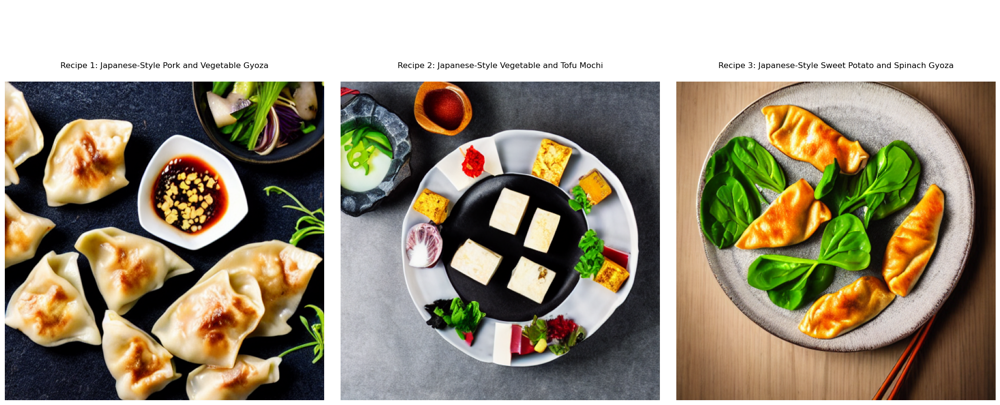

INFO:__main__:Saved image for recipe 1
INFO:__main__:Saved text for recipe 1



Recipe 1:
Title: Japanese-Style Pork and Vegetable Gyoza

Recipe Content:
**Recipe 1:**
**Title:**
Japanese-Style Pork and Vegetable Gyoza
**Ingredients:**
**
- 1 package of round wonton wrappers (about 20-24 wrappers)
- 1 pound ground pork
- 1/2 cup finely chopped cabbage
- 1/2 cup finely chopped carrots
- 1/4 cup finely chopped green onions
- 2 cloves garlic, minced
- 2 tablespoons soy sauce
- 2 tablespoons sesame oil
- Salt and pepper to taste
- Water for boiling
**
**Instructions:**
**
1. In a large mixing bowl, combine ground pork, chopped cabbage, carrots, green onions, and garlic. Mix well until all ingredients are fully incorporated.
2. Lay a wonton wrapper on a flat surface. Place a tablespoon of the pork mixture in the center of the wrapper.
3. Dip your finger in water and run it along the edges of the wrapper. Fold the wrapper into a triangle by bringing the two opposite corners together to form a point. Press the edges together to seal the dumpling.
4. Repeat with the rema

INFO:__main__:Saved image for recipe 2
INFO:__main__:Saved text for recipe 2
INFO:__main__:Saved image for recipe 3
INFO:__main__:Saved text for recipe 3
INFO:__main__:Saved full recipes to recipes_20241112_170150.json
INFO:__main__:Saved text-only version to recipes_text_20241112_170150.json
INFO:__main__:Cleaning up endpoints...
INFO:sagemaker:Deleting endpoint configuration with name: stable-diffusion-v1-5-2024-11-12-16-54-22-801
INFO:sagemaker:Deleting endpoint with name: stable-diffusion-v1-5-2024-11-12-16-54-22-801
INFO:__main__:Cleanup completed


In [57]:
"""
Recipe Generator with Image Creation
Organization:
- Part 1: Configuration and Setup
- Part 2: Recipe Processing
- Part 3: Output Handling
- Part 4: Main Execution
"""

#######################
# Part 1: Configuration and Setup
#######################

# Required imports for Part 1
import logging
import json
import boto3
from sagemaker.jumpstart.model import JumpStartModel
from langchain_community.llms import SagemakerEndpoint
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Recipe generation prompt template
RECIPE_PROMPT =PROMPT = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant that generates recipes in a well-structured format.
Generate THREE (3) COMPLETELY DIFFERENT recipes based on the user's request.
Ensure that ingredients are listed only once in each recipe and avoid repeating any entries. 
The recipes should each include the following sections:
1. **Title** of the recipe
2. **Ingredients List** with measurements (avoid repeats)
3. **Instructions** in numbered steps for preparation

Return the recipes in the following format, ensuring each of the three recipes is structured exactly as follows:

**Recipe 1:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 2:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 3:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

Make sure the formatting follows the above structure exactly and that each recipe is completely unique.
<|eot_id|><|start_header_id|>user<|end_header_id|>
{query}
<|eot_id|><|start_header_id|>assistant<|end_header_id|>"""

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"
    
    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            "parameters": {
                "max_new_tokens": 1000,
                "top_p": 0.9,
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        return json.dumps(payload).encode("utf-8")
        
    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["generated_text"].strip()

def setup_llm(endpoint_name):
    """Initialize the LLM endpoint"""
    sess = boto3.Session()
    region = sess.region_name
    
    llm_content_handler = Llama38BContentHandler()
    
    llm = SagemakerEndpoint(
        endpoint_name=endpoint_name,
        region_name=region,
        model_kwargs={"max_new_tokens": 1000, "top_p": 0.9, "temperature": 0.8},
        content_handler=llm_content_handler
    )
    logger.info("LLM endpoint initialized")
    return llm

def setup_image_model(instance_type="ml.g4dn.xlarge"):
    """Initialize and deploy the image generation model"""
    logger.info("Initializing image generation model...")
    image_model_id = "huggingface-txt2img-runwayml-stable-diffusion-v1-5"
    
    logger.info(f"Using instance type: {instance_type}")
    
    image_model = JumpStartModel(
        model_id=image_model_id,
        model_version="2.0.1",
        instance_type=instance_type
    )
    
    logger.info("Starting image model deployment...")
    image_predictor = image_model.deploy(
        initial_instance_count=1,
        instance_type=instance_type,
        wait=True,
        model_data_download_timeout=1800,
        container_startup_health_check_timeout=1800
    )
    
    # Wait for endpoint to be ready
    sagemaker_client = boto3.client('sagemaker')
    waiter = sagemaker_client.get_waiter('endpoint_in_service')
    
    waiter.wait(
        EndpointName=image_predictor.endpoint_name,
        WaiterConfig={'Delay': 30, 'MaxAttempts': 60}
    )
    logger.info("Endpoint is in service")
    
    return image_predictor

#######################
# Part 2: Recipe Processing
#######################

# Additional imports for Part 2
def extract_title(recipe_text: str) -> Optional[str]:
    """Extract the title from a recipe text."""
    try:
        if "**Title:**" in recipe_text:
            title_section = recipe_text.split("**Title:**")[1]
            lines = [line.strip() for line in title_section.split('\n')]
            
            for line in lines:
                # Skip empty lines, ingredient lines, and section headers
                if not line or line.startswith('-') or line.startswith('*') or "Ingredients" in line or "Instructions" in line:
                    continue
                # Clean up the title
                title = line.replace('*', '').strip()
                if title:
                    return title
    except Exception as e:
        logger.error(f"Error extracting title: {str(e)}")
    return None

def clean_recipe_text(recipe_text: str) -> str:
    """Clean up recipe text formatting."""
    lines = recipe_text.split('\n')
    cleaned_lines = []
    in_title_section = False
    
    for line in lines:
        # Skip empty lines
        if not line.strip():
            continue
        
        # Track if we're in the title section
        if "**Title:**" in line:
            in_title_section = True
            cleaned_lines.append(line)
            continue
        elif "**Ingredients:**" in line:
            in_title_section = False
        
        # Clean up the line
        cleaned_line = line.strip()
        
        # Skip ingredient lines in title section
        if in_title_section and cleaned_line.startswith('-'):
            continue
            
        # Format headers
        if any(header in line for header in ["Title:", "Ingredients:", "Instructions:"]):
            cleaned_line = f"**{cleaned_line}**"
            
        if cleaned_line:
            cleaned_lines.append(cleaned_line)
    
    return '\n'.join(cleaned_lines)

def generate_recipes_with_images(llm, image_predictor, query: str) -> List[Dict]:
    try:
        logger.info(f"Generating recipes for query: {query}")
        
        # Generate recipes
        logger.info("Calling LLM with prompt...")
        response = llm.predict(RECIPE_PROMPT.format(query=query))
        logger.info("Received response from LLM")
        
        # Split and clean up recipes
        recipes_parts = response.split("**Recipe")
        recipe_texts = [text for text in recipes_parts if "Title:" in text]
        
        logger.info(f"Found {len(recipe_texts)} recipe texts")
        
        # Ensure we have exactly 3 recipes
        if len(recipe_texts) != 3:
            logger.warning(f"Got {len(recipe_texts)} recipes instead of 3")
            if len(recipe_texts) > 3:
                recipe_texts = recipe_texts[:3]
            else:
                logger.error("Not enough recipes generated")
                return []
        
        results = []
        for i, recipe_text in enumerate(recipe_texts, 1):
            logger.info(f"\nProcessing recipe {i} of 3")
            
            # Clean and format recipe text
            cleaned_text = clean_recipe_text(recipe_text)
            title = extract_title(cleaned_text)
            
            if not title:
                logger.error(f"Could not extract title from recipe {i}")
                continue
            
            logger.info(f"Found title for recipe {i}: {title}")
            
            try:
                # Generate image
                image_prompt = f"professional food photography of {title}, high resolution, appetizing, styled plating, restaurant quality"
                image_response = image_predictor.predict(
                    image_prompt, 
                    {"ContentType": "application/x-text", "Accept": "application/json"}
                )
                if not image_response or 'generated_image' not in image_response:
                    logger.error(f"No image generated for recipe {i}")
                    continue
                
                # Format the recipe text properly
                formatted_text = f"""**Recipe {i}:**
**Title:**
{title}
**Ingredients:**
{cleaned_text.split('**Ingredients:**')[1].split('**Instructions:**')[0].strip()}
**Instructions:**
{cleaned_text.split('**Instructions:**')[1].strip()}"""
                
                results.append({
                    'recipe_text': formatted_text,
                    'title': title,
                    'image_data': image_response.get('generated_image'),
                    'recipe_number': i
                })
                logger.info(f"Successfully processed recipe {i}: {title}")
                
            except Exception as e:
                logger.error(f"Error processing recipe {i}: {str(e)}")
                logger.error(traceback.format_exc())
                continue
        
        return results
        
    except Exception as e:
        logger.error(f"Error in recipe generation: {str(e)}")
        logger.error(traceback.format_exc())
        return []
#######################
# Part 3: Output Handling
#######################

# Additional imports for Part 3
import matplotlib.pyplot as plt
from PIL import Image
import io
import numpy as np
from datetime import datetime
import base64

def display_recipes(recipe_results: list):
    """Display recipes with images in a grid layout."""
    if not recipe_results:
        logger.warning("No recipes to display")
        return
        
    # Create subplot grid
    n_recipes = len(recipe_results)
    fig, axes = plt.subplots(1, n_recipes, figsize=(7*n_recipes, 7))
    if n_recipes == 1:
        axes = [axes]
    
    # Display images
    for recipe, ax in zip(recipe_results, axes):
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                ax.imshow(img_array)
                ax.axis('off')
                ax.set_title(f"Recipe {recipe['recipe_number']}: {recipe['title']}", 
                           pad=20, wrap=True)
            except Exception as e:
                logger.error(f"Error displaying image: {str(e)}")
                ax.text(0.5, 0.5, 'Image display failed', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print recipes
    for recipe in recipe_results:
        print(f"\nRecipe {recipe['recipe_number']}:")
        print(f"Title: {recipe['title']}")
        print("\nRecipe Content:")
        print(recipe['recipe_text'])
        print("\n" + "="*50)

def save_recipes(recipe_results: list):
    """Save recipes as text files and images."""
    for recipe in recipe_results:
        # Save image
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                Image.fromarray(img_array).save(f'recipe_image_{recipe["recipe_number"]}.png')
                logger.info(f"Saved image for recipe {recipe['recipe_number']}")
            except Exception as e:
                logger.error(f"Error saving image: {str(e)}")
        
        # Save recipe text
        try:
            with open(f'recipe_{recipe["recipe_number"]}.txt', 'w', encoding='utf-8') as f:
                f.write(f"Title: {recipe['title']}\n\n")
                f.write(recipe['recipe_text'])
            logger.info(f"Saved text for recipe {recipe['recipe_number']}")
        except Exception as e:
            logger.error(f"Error saving recipe text: {str(e)}")

def save_to_json(recipe_results: list):
    """Save recipes to JSON files (full and text-only versions)."""
    try:
        recipes_data = {
            'metadata': {
                'generated_date': datetime.now().isoformat(),
                'number_of_recipes': len(recipe_results)
            },
            'recipes': []
        }
        
        for recipe in recipe_results:
            # Convert image data to base64
            image_data = None
            if recipe['image_data'] is not None:
                try:
                    if isinstance(recipe['image_data'], list):
                        image_bytes = np.array(recipe['image_data'], dtype=np.uint8).tobytes()
                    else:
                        image_bytes = recipe['image_data']
                    image_data = base64.b64encode(image_bytes).decode('utf-8')
                except Exception as e:
                    logger.warning(f"Could not encode image: {str(e)}")
            
            recipes_data['recipes'].append({
                'recipe_number': recipe['recipe_number'],
                'title': recipe['title'],
                'recipe_text': recipe['recipe_text'],
                'image_data': image_data
            })
        
        # Save full version
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f'recipes_{timestamp}.json'
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(recipes_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved full recipes to {filename}")
        
        # Save text-only version
        text_filename = f'recipes_text_{timestamp}.json'
        text_data = {
            'metadata': recipes_data['metadata'],
            'recipes': [{k: v for k, v in r.items() if k != 'image_data'} 
                       for r in recipes_data['recipes']]
        }
        with open(text_filename, 'w', encoding='utf-8') as f:
            json.dump(text_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved text-only version to {text_filename}")
        
        return filename, text_filename
    except Exception as e:
        logger.error(f"Error saving to JSON: {str(e)}")
        return None, None

#######################
# Part 4: Main Execution
#######################

def main():
    image_predictor = None
    try:
        # Initialize LLM
        llm = setup_llm("meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325")
        
        # Setup image model
        image_predictor = setup_image_model()
        
        # Generate recipes
        query = "I am allergic to fish and shellfish. Can you give me a Japanese dumpling recipe free from seafood?"
        recipe_results = generate_recipes_with_images(llm, image_predictor, query)
        
        if recipe_results:
            # Display and save results
            display_recipes(recipe_results)
            save_recipes(recipe_results)
            save_to_json(recipe_results)
        else:
            logger.error("No recipes were generated")
            
    except Exception as e:
        logger.error(f"Error in main execution: {str(e)}")
    finally:
        if image_predictor:
            try:
                logger.info("Cleaning up endpoints...")
                image_predictor.delete_endpoint()
                logger.info("Cleanup completed")
            except Exception as e:
                logger.error(f"Error during cleanup: {str(e)}")

if __name__ == "__main__":
    main()  

#### Multiple Allergens - Nuts & Milk 

In [ ]:
"""
Recipe Generator with Image Creation
Organization:
- Part 1: Configuration and Setup
- Part 2: Recipe Processing
- Part 3: Output Handling
- Part 4: Main Execution
"""

#######################
# Part 1: Configuration and Setup
#######################

# Required imports for Part 1
import logging
import json
import boto3
from sagemaker.jumpstart.model import JumpStartModel
from langchain_community.llms import SagemakerEndpoint
from langchain_community.llms.sagemaker_endpoint import LLMContentHandler

# Set up logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Recipe generation prompt template
RECIPE_PROMPT =PROMPT = """<|begin_of_text|><|start_header_id|>system<|end_header_id|>
You are a helpful assistant that generates recipes in a well-structured format.
Generate THREE (3) COMPLETELY DIFFERENT recipes based on the user's request.
Ensure that ingredients are listed only once in each recipe and avoid repeating any entries. 
The recipes should each include the following sections:
1. **Title** of the recipe
2. **Ingredients List** with measurements (avoid repeats)
3. **Instructions** in numbered steps for preparation

Return the recipes in the following format, ensuring each of the three recipes is structured exactly as follows:

**Recipe 1:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 2:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

**Recipe 3:**
**Title:**
[Recipe title here]
**Ingredients:**
- [Ingredient 1]
- [Ingredient 2]
- [Ingredient 3]
**Instructions:**
1. [Step 1]
2. [Step 2]
3. [Step 3]

Make sure the formatting follows the above structure exactly and that each recipe is completely unique.
<|eot_id|><|start_header_id|>user<|end_header_id|>
{query}
<|eot_id|><|start_header_id|>assistant<|end_header_id|>"""

class Llama38BContentHandler(LLMContentHandler):
    content_type = "application/json"
    accepts = "application/json"
    
    def transform_input(self, prompt: str, model_kwargs: dict) -> bytes:
        payload = {
            "inputs": prompt,
            "parameters": {
                "max_new_tokens": 1000,
                "top_p": 0.9,
                "temperature": 0.8,
                "stop": ["<|eot_id|>"],
            },
        }
        return json.dumps(payload).encode("utf-8")
        
    def transform_output(self, output: bytes) -> str:
        response_json = json.loads(output.read().decode("utf-8"))
        return response_json["generated_text"].strip()

def setup_llm(endpoint_name):
    """Initialize the LLM endpoint"""
    sess = boto3.Session()
    region = sess.region_name
    
    llm_content_handler = Llama38BContentHandler()
    
    llm = SagemakerEndpoint(
        endpoint_name=endpoint_name,
        region_name=region,
        model_kwargs={"max_new_tokens": 1000, "top_p": 0.9, "temperature": 0.8},
        content_handler=llm_content_handler
    )
    logger.info("LLM endpoint initialized")
    return llm

def setup_image_model(instance_type="ml.g4dn.xlarge"):
    """Initialize and deploy the image generation model"""
    logger.info("Initializing image generation model...")
    image_model_id = "huggingface-txt2img-runwayml-stable-diffusion-v1-5"
    
    logger.info(f"Using instance type: {instance_type}")
    
    image_model = JumpStartModel(
        model_id=image_model_id,
        model_version="2.0.1",
        instance_type=instance_type
    )
    
    logger.info("Starting image model deployment...")
    image_predictor = image_model.deploy(
        initial_instance_count=1,
        instance_type=instance_type,
        wait=True,
        model_data_download_timeout=1800,
        container_startup_health_check_timeout=1800
    )
    
    # Wait for endpoint to be ready
    sagemaker_client = boto3.client('sagemaker')
    waiter = sagemaker_client.get_waiter('endpoint_in_service')
    
    waiter.wait(
        EndpointName=image_predictor.endpoint_name,
        WaiterConfig={'Delay': 30, 'MaxAttempts': 60}
    )
    logger.info("Endpoint is in service")
    
    return image_predictor

#######################
# Part 2: Recipe Processing
#######################

# Additional imports for Part 2
def extract_title(recipe_text: str) -> Optional[str]:
    """Extract the title from a recipe text."""
    try:
        if "**Title:**" in recipe_text:
            title_section = recipe_text.split("**Title:**")[1]
            lines = [line.strip() for line in title_section.split('\n')]
            
            for line in lines:
                # Skip empty lines, ingredient lines, and section headers
                if not line or line.startswith('-') or line.startswith('*') or "Ingredients" in line or "Instructions" in line:
                    continue
                # Clean up the title
                title = line.replace('*', '').strip()
                if title:
                    return title
    except Exception as e:
        logger.error(f"Error extracting title: {str(e)}")
    return None

def clean_recipe_text(recipe_text: str) -> str:
    """Clean up recipe text formatting."""
    lines = recipe_text.split('\n')
    cleaned_lines = []
    in_title_section = False
    
    for line in lines:
        # Skip empty lines
        if not line.strip():
            continue
        
        # Track if we're in the title section
        if "**Title:**" in line:
            in_title_section = True
            cleaned_lines.append(line)
            continue
        elif "**Ingredients:**" in line:
            in_title_section = False
        
        # Clean up the line
        cleaned_line = line.strip()
        
        # Skip ingredient lines in title section
        if in_title_section and cleaned_line.startswith('-'):
            continue
            
        # Format headers
        if any(header in line for header in ["Title:", "Ingredients:", "Instructions:"]):
            cleaned_line = f"**{cleaned_line}**"
            
        if cleaned_line:
            cleaned_lines.append(cleaned_line)
    
    return '\n'.join(cleaned_lines)

def generate_recipes_with_images(llm, image_predictor, query: str) -> List[Dict]:
    try:
        logger.info(f"Generating recipes for query: {query}")
        
        # Generate recipes
        logger.info("Calling LLM with prompt...")
        response = llm.predict(RECIPE_PROMPT.format(query=query))
        logger.info("Received response from LLM")
        
        # Split and clean up recipes
        recipes_parts = response.split("**Recipe")
        recipe_texts = [text for text in recipes_parts if "Title:" in text]
        
        logger.info(f"Found {len(recipe_texts)} recipe texts")
        
        # Ensure we have exactly 3 recipes
        if len(recipe_texts) != 3:
            logger.warning(f"Got {len(recipe_texts)} recipes instead of 3")
            if len(recipe_texts) > 3:
                recipe_texts = recipe_texts[:3]
            else:
                logger.error("Not enough recipes generated")
                return []
        
        results = []
        for i, recipe_text in enumerate(recipe_texts, 1):
            logger.info(f"\nProcessing recipe {i} of 3")
            
            # Clean and format recipe text
            cleaned_text = clean_recipe_text(recipe_text)
            title = extract_title(cleaned_text)
            
            if not title:
                logger.error(f"Could not extract title from recipe {i}")
                continue
            
            logger.info(f"Found title for recipe {i}: {title}")
            
            try:
                # Generate image
                image_prompt = f"professional food photography of {title}, high resolution, appetizing, styled plating, restaurant quality"
                image_response = image_predictor.predict(
                    image_prompt, 
                    {"ContentType": "application/x-text", "Accept": "application/json"}
                )
                if not image_response or 'generated_image' not in image_response:
                    logger.error(f"No image generated for recipe {i}")
                    continue
                
                # Format the recipe text properly
                formatted_text = f"""**Recipe {i}:**
**Title:**
{title}
**Ingredients:**
{cleaned_text.split('**Ingredients:**')[1].split('**Instructions:**')[0].strip()}
**Instructions:**
{cleaned_text.split('**Instructions:**')[1].strip()}"""
                
                results.append({
                    'recipe_text': formatted_text,
                    'title': title,
                    'image_data': image_response.get('generated_image'),
                    'recipe_number': i
                })
                logger.info(f"Successfully processed recipe {i}: {title}")
                
            except Exception as e:
                logger.error(f"Error processing recipe {i}: {str(e)}")
                logger.error(traceback.format_exc())
                continue
        
        return results
        
    except Exception as e:
        logger.error(f"Error in recipe generation: {str(e)}")
        logger.error(traceback.format_exc())
        return []
#######################
# Part 3: Output Handling
#######################

# Additional imports for Part 3
import matplotlib.pyplot as plt
from PIL import Image
import io
import numpy as np
from datetime import datetime
import base64

def display_recipes(recipe_results: list):
    """Display recipes with images in a grid layout."""
    if not recipe_results:
        logger.warning("No recipes to display")
        return
        
    # Create subplot grid
    n_recipes = len(recipe_results)
    fig, axes = plt.subplots(1, n_recipes, figsize=(7*n_recipes, 7))
    if n_recipes == 1:
        axes = [axes]
    
    # Display images
    for recipe, ax in zip(recipe_results, axes):
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                ax.imshow(img_array)
                ax.axis('off')
                ax.set_title(f"Recipe {recipe['recipe_number']}: {recipe['title']}", 
                           pad=20, wrap=True)
            except Exception as e:
                logger.error(f"Error displaying image: {str(e)}")
                ax.text(0.5, 0.5, 'Image display failed', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print recipes
    for recipe in recipe_results:
        print(f"\nRecipe {recipe['recipe_number']}:")
        print(f"Title: {recipe['title']}")
        print("\nRecipe Content:")
        print(recipe['recipe_text'])
        print("\n" + "="*50)

def save_recipes(recipe_results: list):
    """Save recipes as text files and images."""
    for recipe in recipe_results:
        # Save image
        if recipe['image_data']:
            try:
                img_array = (np.array(recipe['image_data'], dtype=np.uint8) 
                           if isinstance(recipe['image_data'], list) 
                           else np.array(Image.open(io.BytesIO(recipe['image_data']))))
                
                Image.fromarray(img_array).save(f'recipe_image_{recipe["recipe_number"]}.png')
                logger.info(f"Saved image for recipe {recipe['recipe_number']}")
            except Exception as e:
                logger.error(f"Error saving image: {str(e)}")
        
        # Save recipe text
        try:
            with open(f'recipe_{recipe["recipe_number"]}.txt', 'w', encoding='utf-8') as f:
                f.write(f"Title: {recipe['title']}\n\n")
                f.write(recipe['recipe_text'])
            logger.info(f"Saved text for recipe {recipe['recipe_number']}")
        except Exception as e:
            logger.error(f"Error saving recipe text: {str(e)}")

def save_to_json(recipe_results: list):
    """Save recipes to JSON files (full and text-only versions)."""
    try:
        recipes_data = {
            'metadata': {
                'generated_date': datetime.now().isoformat(),
                'number_of_recipes': len(recipe_results)
            },
            'recipes': []
        }
        
        for recipe in recipe_results:
            # Convert image data to base64
            image_data = None
            if recipe['image_data'] is not None:
                try:
                    if isinstance(recipe['image_data'], list):
                        image_bytes = np.array(recipe['image_data'], dtype=np.uint8).tobytes()
                    else:
                        image_bytes = recipe['image_data']
                    image_data = base64.b64encode(image_bytes).decode('utf-8')
                except Exception as e:
                    logger.warning(f"Could not encode image: {str(e)}")
            
            recipes_data['recipes'].append({
                'recipe_number': recipe['recipe_number'],
                'title': recipe['title'],
                'recipe_text': recipe['recipe_text'],
                'image_data': image_data
            })
        
        # Save full version
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f'recipes_{timestamp}.json'
        with open(filename, 'w', encoding='utf-8') as f:
            json.dump(recipes_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved full recipes to {filename}")
        
        # Save text-only version
        text_filename = f'recipes_text_{timestamp}.json'
        text_data = {
            'metadata': recipes_data['metadata'],
            'recipes': [{k: v for k, v in r.items() if k != 'image_data'} 
                       for r in recipes_data['recipes']]
        }
        with open(text_filename, 'w', encoding='utf-8') as f:
            json.dump(text_data, f, indent=2, ensure_ascii=False)
        logger.info(f"Saved text-only version to {text_filename}")
        
        return filename, text_filename
    except Exception as e:
        logger.error(f"Error saving to JSON: {str(e)}")
        return None, None

#######################
# Part 4: Main Execution
#######################

def main():
    image_predictor = None
    try:
        # Initialize LLM
        llm = setup_llm("meta-textgeneration-llama-3-8b-instruct-2024-11-12-12-12-22-325")
        
        # Setup image model
        image_predictor = setup_image_model()
        
        # Generate recipes
        query = "I am allergic to nuts and milk. Can you give me a recipe free of nuts and milk?"
        recipe_results = generate_recipes_with_images(llm, image_predictor, query)
        
        if recipe_results:
            # Display and save results
            display_recipes(recipe_results)
            save_recipes(recipe_results)
            save_to_json(recipe_results)
        else:
            logger.error("No recipes were generated")
            
    except Exception as e:
        logger.error(f"Error in main execution: {str(e)}")
    finally:
        if image_predictor:
            try:
                logger.info("Cleaning up endpoints...")
                image_predictor.delete_endpoint()
                logger.info("Cleanup completed")
            except Exception as e:
                logger.error(f"Error during cleanup: {str(e)}")

if __name__ == "__main__":
    main()           

INFO:__main__:LLM endpoint initialized
INFO:__main__:Initializing image generation model...
INFO:__main__:Using instance type: ml.g4dn.xlarge
INFO:__main__:Starting image model deployment...
INFO:sagemaker:Creating model with name: stable-diffusion-v1-5-2024-11-12-17-03-06-891
INFO:sagemaker:Creating endpoint-config with name stable-diffusion-v1-5-2024-11-12-17-03-06-892
INFO:sagemaker:Creating endpoint with name stable-diffusion-v1-5-2024-11-12-17-03-06-892


-----------!

INFO:__main__:Endpoint is in service
INFO:__main__:Generating recipes for query: I am allergic to nuts and milk. Can you give me a recipe free of nuts and milk?
INFO:__main__:Calling LLM with prompt...
INFO:__main__:Received response from LLM
INFO:__main__:Found 3 recipe texts
INFO:__main__:
Processing recipe 1 of 3
INFO:__main__:Found title for recipe 1: Quinoa and Black Bean Chili
INFO:__main__:Successfully processed recipe 1: Quinoa and Black Bean Chili
INFO:__main__:
Processing recipe 2 of 3
INFO:__main__:Found title for recipe 2: Grilled Lemon Herb Chicken
INFO:__main__:Successfully processed recipe 2: Grilled Lemon Herb Chicken
INFO:__main__:
Processing recipe 3 of 3
INFO:__main__:Found title for recipe 3: Roasted Sweet Potato and Carrot Soup
